In [1]:
import numpy as np
import pandas as pd
from scipy.stats import nbinom
import torch
import os

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns

def generate_spatial_factors(n_cells, n_factors, seed=None):
    if seed is not None:
        np.random.seed(seed)
    # Spatial coordinates
    coords = np.indices((36, 36)).reshape(2, -1).T  # 36x36 = 1296
    assert coords.shape[0] == n_cells

    # Gaussian blob-like spatial factors
    factors = []
    for _ in range(n_factors):
        center = np.random.uniform(0, 36, size=2)
        dists = np.linalg.norm(coords - center, axis=1)
        factor = np.exp(-dists**2 / (2 * 6.0**2))  # Gaussian spread
        factors.append(factor)
    return np.stack(factors, axis=1), coords

def generate_expression(factors, weights, dist='zinb', noise_std=0.05, seed=None):
    if seed is not None:
        np.random.seed(seed)
    expr = factors @ weights  # low-rank nonnegative factorization

    if dist == 'zinb':
        # ZINB-like: add dropout
        dropout = np.random.binomial(1, 0.2, size=expr.shape)
        expr *= dropout

    # Negative binomial sampling
    dispersion = 1.5
    mu = np.clip(expr, 1e-3, None)
    var = mu + mu**2 / dispersion
    p = mu / var
    n = mu**2 / (var - mu)

    expr_counts = nbinom(n, 1 - p).rvs()
    
    # Add Gaussian noise
    expr_counts = expr_counts + np.random.normal(0, noise_std, expr_counts.shape)
    expr_counts = np.clip(expr_counts, 0, None)  # No negatives
    return expr_counts

def simulate_dataset(seed=0):
    n_cells = 1296
    n_genes = 1000
    n_proteins = 100
    n_factors = 4

    # 1. Generate shared spatial factors
    spatial_factors, coords = generate_spatial_factors(n_cells, n_factors, seed=seed)

    # 2. Random weights per modality
    gene_weights = np.abs(np.random.randn(n_factors, n_genes))
    protein_weights = np.abs(np.random.randn(n_factors, n_proteins))

    # 3. Generate expression matrices
    gene_expr = generate_expression(spatial_factors, gene_weights, dist='zinb', seed=seed)
    protein_expr = generate_expression(spatial_factors, protein_weights, dist='nb', seed=seed + 1)

    return {
        'coords': coords,
        'gene_expr': gene_expr,
        'protein_expr': protein_expr
    }

# 生成 5 个模拟数据集并保存
output_dir = 'sim_data'
os.makedirs(output_dir, exist_ok=True)

for i in range(5):
    data = simulate_dataset(seed=i)
    np.savez_compressed(f"{output_dir}/sim_dataset_{i+1}.npz",
                        coords=data['coords'],
                        gene_expr=data['gene_expr'],
                        protein_expr=data['protein_expr'])
    print(f"Saved: sim_dataset_{i+1}.npz")



def visualize_spatial_expression(npz_path, title=""):
    # Load simulated data
    data = np.load(npz_path)
    coords = data['coords']  # (1296, 2)
    gene_expr = data['gene_expr']  # (1296, 1000)

    # Apply PCA to gene expression
    pca = PCA(n_components=3)
    gene_pca = pca.fit_transform(gene_expr)

    # Normalize PCA for color mapping
    norm_pca = (gene_pca - gene_pca.min(0)) / (gene_pca.max(0) - gene_pca.min(0) + 1e-6)

    # Plot with PCA as color (RGB)
    plt.figure(figsize=(6, 6))
    plt.scatter(coords[:, 0], coords[:, 1], 
                c=norm_pca[:, :3], 
                s=10, marker='o')
    plt.gca().invert_yaxis()
    plt.title(f"Spatial PCA Visualization\n{title}")
    plt.xlabel("X Coord")
    plt.ylabel("Y Coord")
    plt.axis("equal")
    plt.tight_layout()
    plt.show()

# 示例：可视化第一个模拟数据集
visualize_spatial_expression("sim_data/sim_dataset_1.npz", title="Sim Dataset 1")

ModuleNotFoundError: No module named 'torch'

In [ ]:
import os
os._exit(0)

In [1]:
import sys
sys.path

['/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python39.zip',
 '/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9',
 '/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/lib-dynload',
 '',
 '/home/users/nus/changxu/.local/lib/python3.9/site-packages',
 '/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages']

In [2]:
import sys
print(sys.executable)

/home/project/11003054/changxu/Conda_envs/dirac-env/bin/python


In [3]:
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv3 as sd

In [4]:
def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=0)

In [5]:
data_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2/sim_data"
data_name = "simulation"
methods = "DIRAC"
out_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2"

In [6]:
adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, f"{data_name}_ADT.h5ad"))

In [7]:
adata_RNA.X

array([[14.,  3.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  3.,  0.],
       ...,
       [ 0., 16.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  3.,  0.],
       [11.,  0.,  0., ...,  0., 27.,  6.]], dtype=float32)

In [8]:
adata_Protein.X

array([[ 72.,  12.,   0., ...,   0., 112.,  71.],
       [  0.,   0.,   0., ..., 152.,   0.,  13.],
       [ 12.,   0.,   0., ...,   0., 102.,   0.],
       ...,
       [  0., 103.,  13., ...,  12.,   0., 133.],
       [ 22.,   0.,   0., ..., 173.,  12.,   0.],
       [182.,   0., 122., ...,  83.,  13., 112.]], dtype=float32)

In [9]:
######### Define colors for spatial multi-omics domain
colormaps= ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#A65628", "#FFFF33", "#F781BF", "#999999",
            "#E5D8BD", "#B3CDE3", "#CCEBC5", "#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", "#CAB2D6","#6A3D9A", "#B15928"]

In [10]:
######### Data processing
adata_RNA.obs["Omics"] = data_name + "_mRNA"
adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
adata_Protein.obs["Omics"] = data_name + "_Protein"
adata_Protein.obs['Omics'] = adata_Protein.obs['Omics'].astype('category')

In [11]:
######### Data processing
sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA)
sc.pp.log1p(adata_RNA)
sc.pp.scale(adata_RNA)
sc.tl.pca(adata_RNA, n_comps=50)

In [12]:
sc.pp.normalize_total(adata_Protein)
sc.pp.log1p(adata_Protein)
sc.pp.scale(adata_Protein)

In [13]:
edge_index = sd.utils.get_single_edge_index(adata_RNA.obsm["spatial"], n_neighbors = 8)
print(len(edge_index)/adata_RNA.shape[0])
edge_index = torch.LongTensor(edge_index).T

8.0


In [14]:
y = pd.Categorical(
    np.array(adata_RNA.obs["Omics"]),
    categories=np.unique(adata_RNA.obs["Omics"]),
    ).codes
save_path = os.path.join(out_path, "Results", f"{data_name}_{methods}")
if not os.path.exists(save_path):
    os.makedirs(save_path)

In [15]:
###### Training Dirac for spatial multi-omics
dirac = sd.main.integrate_app(save_path = save_path, 
                              use_gpu = True, 
                              subgraph = False)
samples = dirac._get_data(dataset_list = [adata_RNA.obsm['X_pca'].copy(), adata_Protein.X.copy()],
                        batch_list = [y, y],
                        domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_Protein.shape[0])],
                        edge_index = edge_index)
models = dirac._get_model(samples,
                        n_hiddens = 128,
                        n_outputs = 64,
                        opt_GNN = "GAT",)
data_z, combine_recon, now = dirac._train_dirac_integrate(samples = samples,
                                            models = models,
                                            epochs = 300,
                                            lamb = 5e-4,
                                            scale_loss = 0.025,
                                            lr = 1e-3,
                                            wd = 5e-2)

Found 2 unique domains.


Project..: 100%|█| 300/300 [00:09<00


In [16]:
adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
adata_Protein.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] :, :]
adata_RNA.obsm["combine_recon"] = combine_recon
adata_Protein.obsm["combine_recon"] = combine_recon

/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Best resolution:  0.15000000000000002


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.0.0
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


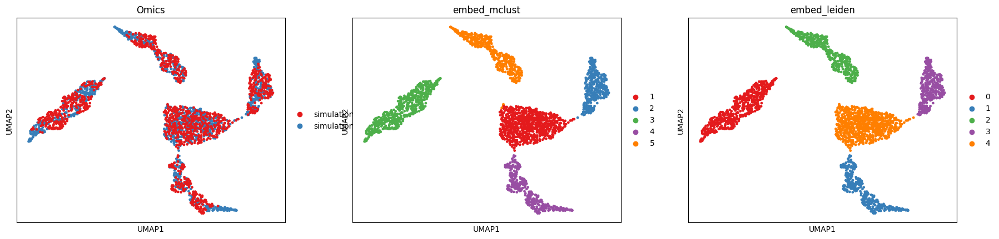

In [17]:
n_clusters = 5
adata = anndata.AnnData(data_z)
adata.obs = pd.concat([adata_RNA.obs, adata_Protein.obs])
adata.obsm[f"{methods}_embed"] = data_z
sc.pp.neighbors(adata, use_rep='X')
sc.tl.umap(adata)
res_RNA_ATAC = sd.utils._priori_cluster(adata, eval_cluster_n = n_clusters)
sc.tl.leiden(adata, resolution = res_RNA_ATAC, key_added="embed_leiden", flavor="igraph", n_iterations=2, directed=False)
sd.utils.mclust_R(adata=adata, num_cluster = n_clusters, used_obsm=f"{methods}_embed", key_added="embed_mclust")
sc.pl.umap(adata, color=['Omics', "embed_mclust", "embed_leiden"], palette = colormaps)
# plt.savefig(os.path.join(save_path, f"{data_name}_{methods}_embed_umap_{now}.pdf"), bbox_inches='tight', dpi = 300)

Best resolution:  0.11000000000000001
fitting ...
  |======================================================================| 100%


[<Axes: title={'center': 'Leiden'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Mclust'}, xlabel='spatial1', ylabel='spatial2'>]

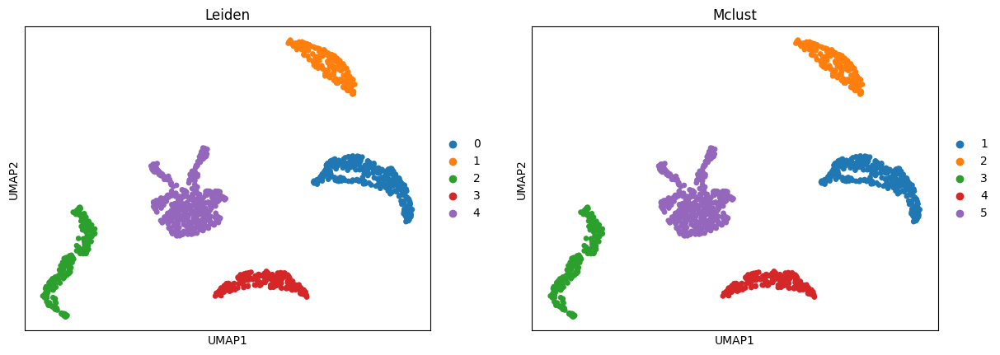

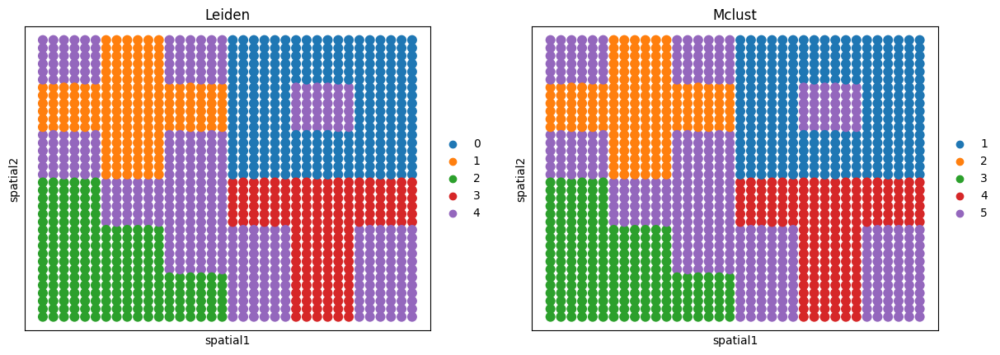

In [18]:
sc.pp.neighbors(adata_RNA, use_rep='combine_recon', n_neighbors=30)
res_RNA_ATAC = sd.utils._priori_cluster(adata_RNA, eval_cluster_n = n_clusters)
sc.tl.leiden(adata_RNA, resolution = res_RNA_ATAC, key_added="Combined_leiden", flavor="igraph", n_iterations=2, directed=False)
sd.utils.mclust_R(adata=adata_RNA, num_cluster = n_clusters, used_obsm="combine_recon",key_added="Combined_mclust")

sc.tl.umap(adata_RNA)

sc.pl.umap(adata_RNA, color=["Combined_leiden",'Combined_mclust'],title=['Leiden','Mclust'], show=False)
sc.pl.embedding(adata_RNA, basis='spatial', color=["Combined_leiden",'Combined_mclust'], title=['Leiden','Mclust'], s=300, show=False)

In [19]:
# import scanpy as sc
# adata_S1 = sc.read("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main/simulations/bm_sp/data/S1.h5ad")
# adata_S6 = sc.read("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main/simulations/bm_sp/data/S6.h5ad")

# def assign_unique_labels(matrix):
#     row_strs = ['_'.join(map(str, row)) for row in matrix]
#     unique_rows, labels = np.unique(row_strs, return_inverse=True)
#     return labels

# labels_S1 = assign_unique_labels(adata_S1.obsm['spfac'])
# adata_S1.obs['ground_truth'] = labels_S1
# adata_S1.obs['ground_truth'] = adata_S1.obs['ground_truth'].astype('category')
# sc.pl.embedding(adata_S1, basis='spatial', color=['ground_truth'], title=['Ground Truth'], s=300, show=False)

# labels_S6 = assign_unique_labels(adata_S6.obsm['spfac'])
# adata_S6.obs['ground_truth'] = labels_S6
# adata_S6.obs['ground_truth'] = adata_S6.obs['ground_truth'].astype('category')
# sc.pl.embedding(adata_S6, basis='spatial', color=['ground_truth'], title=['Ground Truth'], s=300, show=False)

In [ ]:
import os
os._exit(0)

In [1]:
# from os import path
# from copy import deepcopy
# import numpy as np
# import pandas as pd
# from scanpy import read_h5ad
# from janitor import expand_grid, cartesian_product
# import sys
# sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")

# from utils import misc, visualize
# from simulations import sim
# pth = "/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics"
# dpth = path.join(pth,"data")
# rpth = path.join(pth,"results")
# mpth = path.join(pth,"models")
# misc.mkdir_p(dpth) # or use symlink to dropbox
# misc.mkdir_p(rpth)
# misc.mkdir_p(mpth)

# %% define scenarios
# cfg = {"sim":["quilt","ggblocks","both"], "nside":36, "bkg_mean":0.2,
#        "nb_shape":10.0, "Jsp":200, "Jmix":0, "Jns":0, "expr_mean":20.0,
#        "seed":[1,2,3,4,5], "V":5}
# a = expand_grid(others=cfg)
# a.columns = [col if isinstance(col, str) else col[0] for col in a.columns]
# b = pd.DataFrame({"sim":["quilt","ggblocks","both"], "L":[4,4,8]})
# a = a.merge(b,how="left",on="sim")
# a["scenario"] = list(range(1,a.shape[0]+1))
# a.to_csv(path.join(pth,"scenarios.csv"),index=False) #store separately for data generation

# # %% generate the simulated datasets and store to disk
# a = pd.read_csv(path.join(pth,"scenarios.csv")).convert_dtypes()
# def sim2disk(p):
#   p = deepcopy(p)
#   scen = p.pop("scenario")
#   ad = sim.sim(p["sim"], Lns=0, **p)
#   ad.write_h5ad(path.join(dpth,"S{}.h5ad".format(scen)),compression="gzip")
# a.apply(sim2disk,axis=1)

# import os
# import scanpy as sc
# def assign_unique_labels(matrix):
#     row_strs = ['_'.join(map(str, row)) for row in matrix]
#     unique_rows, labels = np.unique(row_strs, return_inverse=True)
#     return labels

# files = [f for f in os.listdir(dpth) if f.endswith(".h5ad")]

# for i in files:
#     ad = sc.read(os.path.join(dpth, i))
#     labels_S1 = assign_unique_labels(ad.obsm['spfac'])
#     ad.obs['ground_truth'] = labels_S1
#     ad.obs['ground_truth'] = ad.obs['ground_truth'].astype('category')
#     sc.pl.embedding(ad, basis='spatial', color=['ground_truth'], title=[i.split('.')[0]], s=300, show=False)

/tmp/ipykernel_2950794/447740183.py:36: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs['ground_truth'] = labels_S1


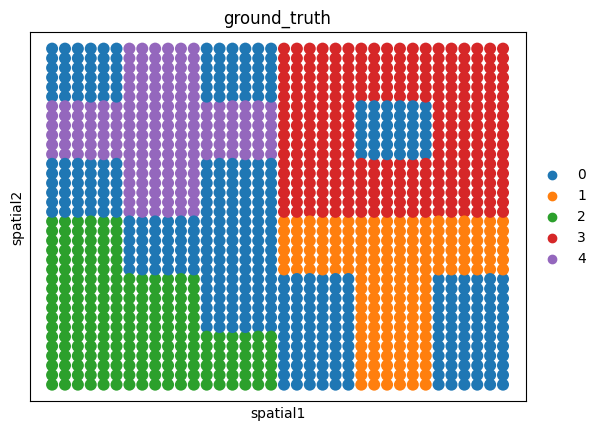

In [50]:
from os import path
from copy import deepcopy
import numpy as np
import pandas as pd
from scanpy import read_h5ad
from janitor import expand_grid, cartesian_product
import os
import scanpy as sc
import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")

from utils import misc
from simulations import sim

pth = "/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics"
dpth = path.join(pth,"data")
rpth = path.join(pth,"results")
mpth = path.join(pth,"models")
misc.mkdir_p(dpth) # or use symlink to dropbox
misc.mkdir_p(rpth)
misc.mkdir_p(mpth)

cfg = {"sim":"ggblocks", "nside":36, "bkg_mean":0.4,
       "nb_shape":10.0, "Jsp":2000, "Jmix":0, "Jns":0, "expr_mean":20.0,
       "seed":1, "V":5}

ad = sim.sim(cfg['sim'], **cfg)


def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

labels_S1 = assign_unique_labels(ad.obsm['spfac'])
ad.obs['ground_truth'] = labels_S1
ad.obs['ground_truth'] = ad.obs['ground_truth'].astype('category')
sc.pl.embedding(ad, basis='spatial', color=['ground_truth'], s=300)


# def sim2disk(p):
#   p = deepcopy(p)
#   scen = p.pop("scenario")
#   ad = sim.sim(p["sim"], Lns=0, **p)
#   ad.write_h5ad(path.join(dpth,"S{}.h5ad".format(scen)),compression="gzip")
# a.apply(sim2disk,axis=1)

# import os
# import scanpy as sc
# def assign_unique_labels(matrix):
#     row_strs = ['_'.join(map(str, row)) for row in matrix]
#     unique_rows, labels = np.unique(row_strs, return_inverse=True)
#     return labels

# files = [f for f in os.listdir(dpth) if f.endswith(".h5ad")]

# for i in files:
#     ad = sc.read(os.path.join(dpth, i))
#     labels_S1 = assign_unique_labels(ad.obsm['spfac'])
#     ad.obs['ground_truth'] = labels_S1
#     ad.obs['ground_truth'] = ad.obs['ground_truth'].astype('category')
#     sc.pl.embedding(ad, basis='spatial', color=['ground_truth'], title=[i.split('.')[0]], s=300, show=False)

In [51]:
ad

AnnData object with n_obs × n_vars = 1296 × 2000
    obs: 'ground_truth'
    uns: 'ground_truth_colors'
    obsm: 'spatial', 'spfac', 'nsfac'
    varm: 'spload', 'nsload'
    layers: 'counts'

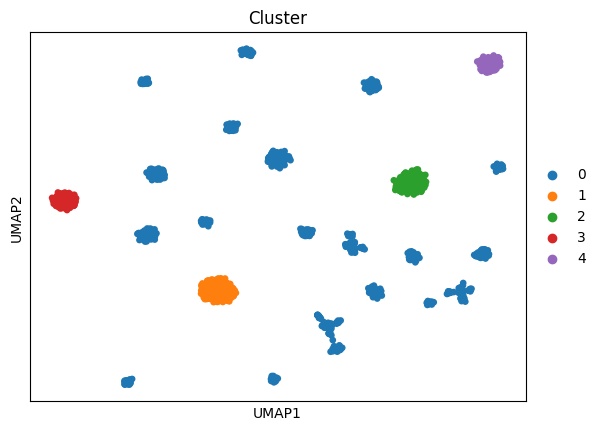

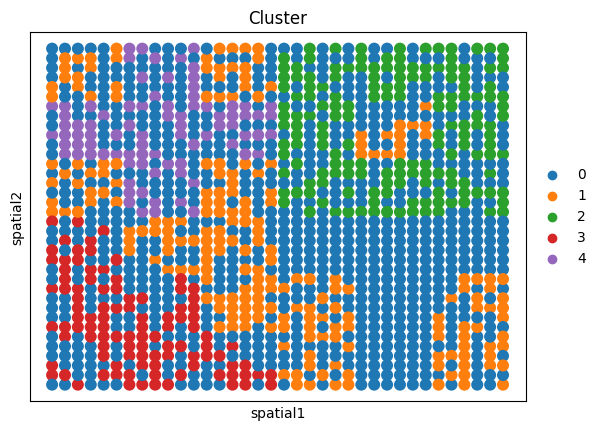

In [8]:
ad = sc.read("/home/project/11003054/changxu/Projects/DIRAC/Section-2/sim_data/simulation_RNA.h5ad")
sc.pp.filter_genes(ad, min_cells=3)
sc.pp.normalize_total(ad)
sc.pp.log1p(ad)
sc.pp.scale(ad)
sc.tl.pca(ad, n_comps=50)
sc.pp.neighbors(ad)
sc.tl.umap(ad)
sc.tl.leiden(ad, resolution = 0.0001, key_added="Cluster")
sc.pl.umap(ad, color=["Cluster"])
# sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=300)
sc.pl.embedding(ad, basis='spatial', color=["Cluster"], s=300)

In [121]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Enhanced spatial simulation with multi-omics data generation
"""
import random
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
from utils import misc, preprocess
dtp = "float32"
random.seed(101)

# Enhanced pattern generation functions
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A

# def enhanced_ggblocks(size=36):
#     """Enhanced ggblocks with more patterns and larger size"""
#     patterns = [
#         squares(size//3),
#         circles(size//3),
#         triangles(size//3),
#         stripes(size//3, 'horizontal'),
#         stripes(size//3, 'vertical'),
#         checkerboards(size//3),
#         crosses(size//3)
#     ]
#     L = len(patterns)
#     pattern_size = patterns[0].size
#     A = np.zeros([L, pattern_size])
#     for i, pattern in enumerate(patterns):
#         A[i, :] = pattern.flatten()
#     return A

# def ggblocks(size=36):
#   A = np.zeros( [ 4 , size ] )
#   A[0, [ 1 , 6 , 7 , 8 , 13 ] ] = 1
#   A[1, [ 3 , 4 , 5 , 9 , 11 , 15 , 16 , 17  ] ] = 1
#   A[2, [ 18 , 24 , 25 , 30 , 31 , 32 ] ] = 1
#   A[3, [ 21 , 22 , 23 , 28 , 34 ] ] = 1
#   return A #basic block size is 6x6  

# def ggblocks(nside=64, block_size=32):
#     """
#     Generate a few large blocky spatial patterns (not repeated tiles).
#     - Each block is a different pattern placed at distinct regions.
#     - block_size must divide nside.
#     """
#     if nside % block_size != 0:
#         raise ValueError("nside must be divisible by block_size")

#     n_blocks = nside // block_size
#     grid = np.zeros((nside, nside))

#     # Define a few distinct binary patterns
#     def square_pattern(size):
#         A = np.zeros((size, size))
#         q = size // 4
#         A[q:-q, q:-q] = 1
#         return A

#     def cross_pattern(size):
#         A = np.zeros((size, size))
#         c = size // 2
#         A[:, c-1:c+1] = 1
#         A[c-1:c+1, :] = 1
#         return A

#     def circle_pattern(size):
#         A = np.zeros((size, size))
#         r = size // 3
#         cx, cy = size // 2, size // 2
#         for i in range(size):
#             for j in range(size):
#                 if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
#                     A[i, j] = 1
#         return A

#     def diag_pattern(size):
#         A = np.eye(size)
#         A += np.fliplr(np.eye(size))
#         return (A > 0).astype(float)

#     patterns = [square_pattern, cross_pattern, circle_pattern, diag_pattern]

#     pattern_count = len(patterns)
#     blocks = []

#     for idx, pat_func in enumerate(patterns):
#         if idx >= n_blocks**2:
#             break  # too many patterns
#         row = idx // n_blocks
#         col = idx % n_blocks
#         start_x = row * block_size
#         start_y = col * block_size
#         grid[start_x:start_x+block_size, start_y:start_y+block_size] = pat_func(block_size)

#     # Return in expected shape: (num_patterns, N)
#     return np.array([grid.flatten()])


# def ggblocks(nside=64, block_size=32):
#     """
#     Generate large blocky spatial patterns where each pattern is a separate class.
#     - Each pattern occupies a distinct block in the spatial grid
#     - block_size must divide nside
#     - Returns: (num_patterns, nside*nside) array where each row is one pattern
#     """
#     if nside % block_size != 0:
#         raise ValueError("nside must be divisible by block_size")

#     n_blocks = nside // block_size
#     num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

#     # Define pattern generators
#     def square_pattern(size):
#         A = np.zeros((size, size))
#         q = size // 4
#         A[q:-q, q:-q] = 1
#         return A

#     def cross_pattern(size):
#         A = np.zeros((size, size))
#         c = size // 2
#         A[:, c-1:c+1] = 1
#         A[c-1:c+1, :] = 1
#         return A

#     def circle_pattern(size):
#         A = np.zeros((size, size))
#         r = size // 3
#         cx, cy = size // 2, size // 2
#         for i in range(size):
#             for j in range(size):
#                 if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
#                     A[i, j] = 1
#         return A

#     def diag_pattern(size):
#         A = np.eye(size)
#         A += np.fliplr(np.eye(size))
#         return (A > 0).astype(float)

#     patterns = [square_pattern, cross_pattern, circle_pattern, diag_pattern]
    
#     # Initialize output array (num_patterns, nside*nside)
#     output = np.zeros((num_patterns, nside*nside))

#     for pattern_idx in range(num_patterns):
#         # Create empty grid for this pattern
#         grid = np.zeros((nside, nside))
        
#         # Calculate block position for this pattern
#         row = pattern_idx // n_blocks
#         col = pattern_idx % n_blocks
        
#         # Only place this pattern in its designated block
#         if row < n_blocks and col < n_blocks:  # Ensure we don't go out of bounds
#             start_x = row * block_size
#             start_y = col * block_size
#             block_pattern = patterns[pattern_idx % len(patterns)](block_size)
#             grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        
#         # Store this pattern's grid
#         output[pattern_idx, :] = grid.flatten()

#     return output

def ggblocks(nside=64, block_size=32):
    """
    Generate large blocky spatial patterns where each pattern is a separate class.
    Includes a five-pointed star pattern.
    - Each pattern occupies a distinct block in the spatial grid
    - block_size must divide nside
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

    # Define pattern generators
    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1
        return A

    def cross_pattern(size, thickness=5):
        """
        Generate a cross pattern with adjustable thickness.
    
        Parameters:
        -----------
        size : int
            The size of the pattern (size x size)
        thickness : int
            The width of the cross bars (default: 3)
    
        Returns:
        --------
        numpy.ndarray
            A 2D array with the cross pattern
        """
        A = np.zeros((size, size))
        c = size // 2  # Center position
    
        # Calculate bar boundaries
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)  # Handle odd thickness
    
        # Make sure we stay within bounds
        start = max(0, start)
        end = min(size, end)
    
        # Draw thicker cross
        A[:, start:end] = 1  # Vertical bar
        A[start:end, :] = 1  # Horizontal bar
    
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2
        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1
        return A

    def star_pattern(size):
        """Generate a five-pointed star pattern"""
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        
        # Create star polygon coordinates
        angles = np.linspace(0, 2*np.pi, 6)[:-1]  # 5 points
        star_points = []
        for i, angle in enumerate(angles):
            # Outer point
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            # Inner point (for star indentation)
            inner_angle = angle + 2*np.pi/10  # Offset by 36 degrees
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        
        # Convert to integer coordinates
        star_points = np.array(star_points).astype(int)
        
        # Fill the polygon
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        
        return A


    # Replace circle pattern with star pattern
    patterns = [square_pattern, circle_pattern, star_pattern, cross_pattern]
    
    # Initialize output array (num_patterns, nside*nside)
    output = np.zeros((num_patterns, nside*nside))

    for pattern_idx in range(num_patterns):
        # Create empty grid for this pattern
        grid = np.zeros((nside, nside))
        
        # Calculate block position for this pattern
        row = pattern_idx // n_blocks
        col = pattern_idx % n_blocks
        
        # Only place this pattern in its designated block
        if row < n_blocks and col < n_blocks:
            start_x = row * block_size
            start_y = col * block_size
            block_pattern = patterns[pattern_idx % len(patterns)](block_size)
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        
        # Store this pattern's grid
        output[pattern_idx, :] = grid.flatten()

    return output


def quilt(size=12):
    """Original quilt patterns"""
    patterns = [
        squares(size),
        crosses(size),
        circles(size),
        triangles(size)
    ]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=36):
    """
    Generate spatial factors for different scenarios
    """
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    """Generate spatial coordinates"""
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]  # make the display the same
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, L=3, nzprob=0.2, seed=101):
    """Generate non-spatial factors"""
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=3, Jsp=0, Jmix=500, Jns=0, 
                 expr_mean=20.0, mix_frac_spat=0.55, 
                 modality='RNA', seed=101):
    """
    Generate loadings matrix for different modalities
    """
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    # Adjust parameters based on modality
    if modality == 'ADT':
        expr_mean = expr_mean * 5  # ADT typically has higher counts
        mix_frac_spat = 0.7  # ADT often more spatially structured
    elif modality == 'Protein':
        expr_mean = expr_mean * 3
        mix_frac_spat = 0.6
    elif modality == 'ATAC':
        expr_mean = expr_mean * 0.5  # ATAC typically has lower counts
        mix_frac_spat = 0.4  # Chromatin accessibility may be less spatially structured
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    # Pure spatial features
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    
    # Mixed features
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    
    # Pure non-spatial features
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, snr=10, seed=101):
    """Add Gaussian noise to data with specified signal-to-noise ratio"""
    rng = np.random.default_rng(seed)
    signal_power = np.mean(data**2)
    noise_power = signal_power / snr
    noise = rng.normal(0, np.sqrt(noise_power), data.shape)
    return data + noise

def sim_multiomics(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
                  nb_shape=10.0, seed=101, **kwargs):
    """
    Simulate multi-omics spatial data (RNA, ADT, Protein, ATAC)
    """
    # Generate common spatial structure
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=3, nzprob=nzprob_nsp, seed=seed)
    
    # Initialize empty AnnData object with correct number of observations
    adata = AnnData(X=np.empty((N, 0)))  # Initialize with N obs and 0 vars
    
    # Add spatial coordinates and factors
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    # Simulate each modality
    modalities = {
        'RNA': {'Jsp': 100, 'Jmix': 500, 'Jns': 100, 'expr_mean': 20},
        'ADT': {'Jsp': 50, 'Jmix': 100, 'Jns': 20, 'expr_mean': 100},
        'ATAC': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 10}
    }
    
    for modality, params in modalities.items():
        # Update params with any modality-specific kwargs
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        
        # Generate loadings for this modality
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        # Simulate counts
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        # Different count models for different modalities
        if modality == 'ATAC':
            # ATAC data often has many zeros and follows ZIP or ZINB
            counts = rng.poisson(Lambda)
            zero_mask = rng.random(Lambda.shape) < 0.3  # 30% additional zeros
            counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
        
        # Add modality-specific Gaussian noise
        counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
        counts = np.clip(counts, 0, None).astype(int)
        
        # Store in AnnData layers
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    # Shuffle indices
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    
    return adata

def sim2anndata(locs, outcome, spfac, spload, nsfac=None, nsload=None):
    """
    Compatibility function to match original function signature
    """
    obsm = {"spatial": locs, "spfac": spfac, "nsfac": nsfac}
    varm = {"spload": spload, "nsload": nsload}
    ad = AnnData(outcome, obsm=obsm, varm=varm)
    ad.layers = {"counts": ad.X.copy()}
    idx = list(range(ad.shape[0]))
    random.shuffle(idx)
    ad = ad[idx, :]
    return ad

def sim(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
       nb_shape=10.0, seed=101, multiomics=False, **kwargs):
    """
    Main simulation function that can handle both single and multi-omics
    """
    if multiomics:
        return sim_multiomics(scenario, nside=nside, nzprob_nsp=nzprob_nsp,
                            bkg_mean=bkg_mean, nb_shape=nb_shape,
                            seed=seed, **kwargs)
    else:
        # Original single-modality simulation
        if scenario == "both":
            F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
            F2 = gen_spatial_factors(nside=nside, scenario="quilt")
            F = np.hstack((F1, F2))
        else:
            F = gen_spatial_factors(scenario=scenario, nside=nside)
        
        rng = np.random.default_rng(seed)
        N = nside**2
        X = gen_spatial_coords(N)
        W, V = gen_loadings(F.shape[1], seed=seed, **kwargs)
        U = gen_nonspatial_factors(N, L=V.shape[1], nzprob=nzprob_nsp, seed=seed)
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        Y = rng.negative_binomial(r, r/(Lambda+r))
        Y = add_gaussian_noise(Y, snr=20, seed=seed)
        Y = np.clip(Y, 0, None).astype(int)
        
        return sim2anndata(X, Y, F, W, nsfac=U, nsload=V)

adata = sim("ggblocks", multiomics=True, nside=64)

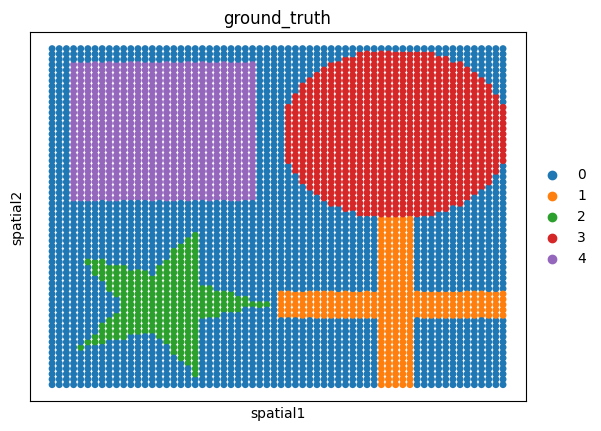

In [122]:
def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

labels_S1 = assign_unique_labels(adata.obsm['spfac'])
adata.obs['ground_truth'] = labels_S1
adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')
sc.pl.embedding(adata, basis='spatial', color=['ground_truth'], s=100)

In [123]:
adata

AnnData object with n_obs × n_vars = 4096 × 0
    obs: 'ground_truth'
    uns: 'loadings_RNA', 'loadings_ADT', 'loadings_ATAC', 'ground_truth_colors'
    obsm: 'spatial', 'spfac', 'nsfac', 'counts_RNA', 'counts_ADT', 'counts_ATAC'

In [141]:
adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
adata_RNA.obsm['spatial'] = adata.obsm['spatial']

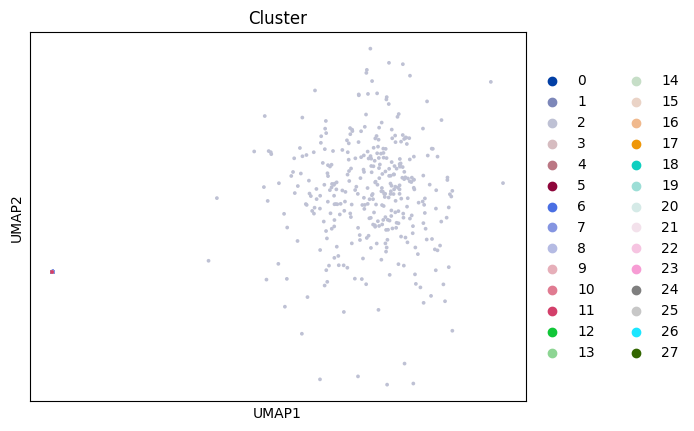

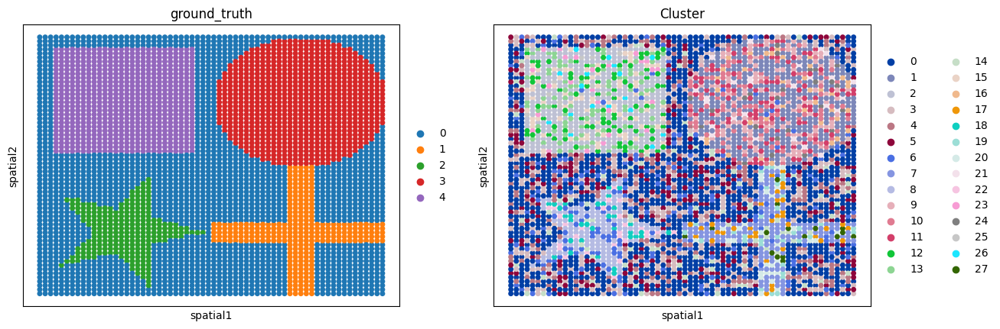

In [143]:
adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
adata_RNA.obsm['spatial'] = adata.obsm['spatial']
def plot_figure_RNA(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

plot_figure_RNA(adata_RNA, res=0.000001)

/home/project/11003054/changxu/Conda_envs/nsf-env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


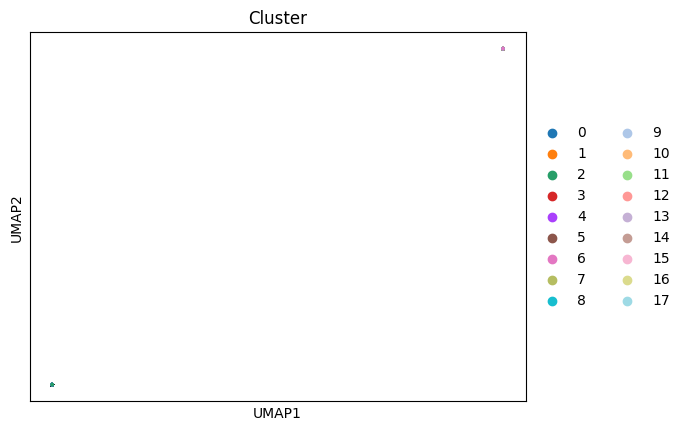

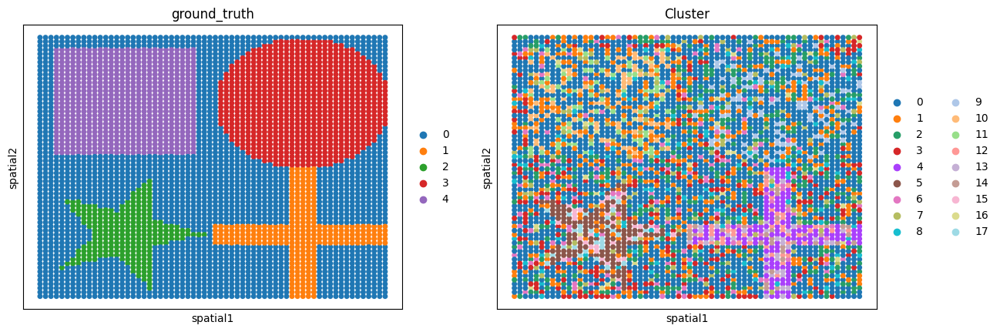

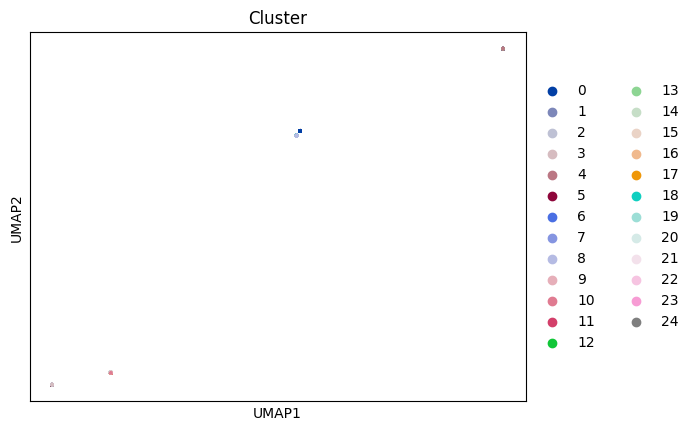

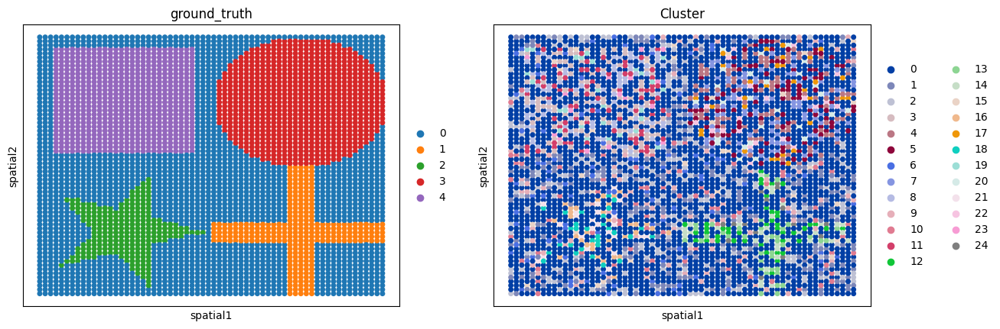

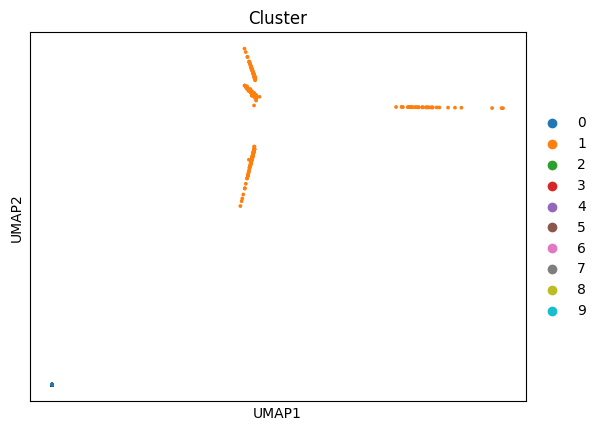

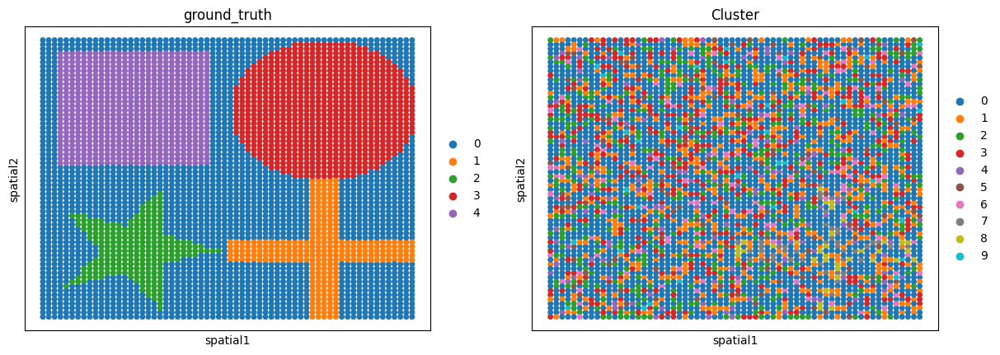

In [10]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Enhanced spatial simulation with multi-omics data generation
"""
import random
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
dtp = "float32"
random.seed(101)
import scanpy as sc
import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")
from utils import misc, preprocess

# Enhanced pattern generation functions
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A


def ggblocks(nside=64, block_size = 32):
    """
    Generate large blocky spatial patterns where each pattern is a separate class.
    Includes a five-pointed star pattern.
    - Each pattern occupies a distinct block in the spatial grid
    - block_size must divide nside
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

    # Define pattern generators
    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1
        return A

    def cross_pattern(size, thickness=5):
        """
        Generate a cross pattern with adjustable thickness.
    
        Parameters:
        -----------
        size : int
            The size of the pattern (size x size)
        thickness : int
            The width of the cross bars (default: 3)
    
        Returns:
        --------
        numpy.ndarray
            A 2D array with the cross pattern
        """
        A = np.zeros((size, size))
        c = size // 2  # Center position
    
        # Calculate bar boundaries
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)  # Handle odd thickness
    
        # Make sure we stay within bounds
        start = max(0, start)
        end = min(size, end)
    
        # Draw thicker cross
        A[:, start:end] = 1  # Vertical bar
        A[start:end, :] = 1  # Horizontal bar
    
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2
        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1
        return A

    def star_pattern(size):
        """Generate a five-pointed star pattern"""
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        
        # Create star polygon coordinates
        angles = np.linspace(0, 2*np.pi, 6)[:-1]  # 5 points
        star_points = []
        for i, angle in enumerate(angles):
            # Outer point
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            # Inner point (for star indentation)
            inner_angle = angle + 2*np.pi/10  # Offset by 36 degrees
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        
        # Convert to integer coordinates
        star_points = np.array(star_points).astype(int)
        
        # Fill the polygon
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        
        return A


    # Replace circle pattern with star pattern
    patterns = [square_pattern, circle_pattern, star_pattern, cross_pattern]
    
    # Initialize output array (num_patterns, nside*nside)
    output = np.zeros((num_patterns, nside*nside))

    for pattern_idx in range(num_patterns):
        # Create empty grid for this pattern
        grid = np.zeros((nside, nside))
        
        # Calculate block position for this pattern
        row = pattern_idx // n_blocks
        col = pattern_idx % n_blocks
        
        # Only place this pattern in its designated block
        if row < n_blocks and col < n_blocks:
            start_x = row * block_size
            start_y = col * block_size
            block_pattern = patterns[pattern_idx % len(patterns)](block_size)
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        
        # Store this pattern's grid
        output[pattern_idx, :] = grid.flatten()

    return output


def quilt(size=12):
    """Original quilt patterns"""
    patterns = [
        squares(size),
        crosses(size),
        circles(size),
        triangles(size)
    ]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=36):
    """
    Generate spatial factors for different scenarios
    """
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    """Generate spatial coordinates"""
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]  # make the display the same
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, L=3, nzprob=0.2, seed=101):
    """Generate non-spatial factors"""
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=3, Jsp=0, Jmix=500, Jns=0, 
                 expr_mean=20.0, mix_frac_spat=0.1, 
                 modality='RNA', seed=101):
    """
    Generate loadings matrix for different modalities
    """
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    # Adjust parameters based on modality
    if modality == 'ADT':
        expr_mean = expr_mean  # ADT typically has higher counts
        mix_frac_spat = 0.2  # ADT often more spatially structured
    elif modality == 'ATAC':
        expr_mean = expr_mean  # ATAC typically has lower counts
        mix_frac_spat = 0.05  # Chromatin accessibility may be less spatially structured
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    # Pure spatial features
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    
    # Mixed features
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    
    # Pure non-spatial features
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, snr=10, seed=101):
    """Add Gaussian noise to data with specified signal-to-noise ratio"""
    rng = np.random.default_rng(seed)
    signal_power = np.mean(data**2)
    noise_power = signal_power / snr
    noise = rng.normal(0, np.sqrt(noise_power), data.shape)
    return data + noise

# def add_gaussian_noise(data, mean=2, variance=0.5, seed=101):
#     """Add Gaussian noise to data with specified mean and variance
    
#     Parameters:
#     -----------
#     data : numpy.ndarray
#         Input data matrix
#     mean : float
#         Mean of the Gaussian noise (default: 2)
#     variance : float
#         Variance of the Gaussian noise (default: 0.5)
#     seed : int
#         Random seed for reproducibility
#     """
#     rng = np.random.default_rng(seed)
#     std_dev = np.sqrt(variance)  # Standard deviation is square root of variance
#     noise = rng.normal(mean, std_dev, data.shape)
#     return data + noise

def sim_multiomics(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
                  nb_shape=10.0, seed=101, **kwargs):
    """
    Simulate multi-omics spatial data (RNA, ADT, ATAC)
    """
    # Generate common spatial structure
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=3, nzprob=nzprob_nsp, seed=seed)
    
    # Initialize empty AnnData object with correct number of observations
    adata = AnnData(X=np.empty((N, 0)))  # Initialize with N obs and 0 vars
    
    # Add spatial coordinates and factors
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    # Simulate each modality
    modalities = {
        'RNA': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 20},
        'ADT': {'Jsp': 50, 'Jmix': 100, 'Jns': 20, 'expr_mean': 100},
        'ATAC': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 10}
    }
    
    for modality, params in modalities.items():
        # Update params with any modality-specific kwargs
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        
        # Generate loadings for this modality
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        # Simulate counts
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        # Different count models for different modalities
        if modality == 'ATAC':
            # ATAC data often has many zeros and follows ZIP or ZINB
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.5  # 30% additional zeros
            counts[zero_mask] = 0
        elif modality == 'RNA':
            counts = rng.negative_binomial(Lambda, r/(Lambda+r))
            counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.4
            counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
            counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
        
        # Add modality-specific Gaussian noise
        # counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
        counts = np.clip(counts, 0, None).astype(int)
        
        # Store in AnnData layers
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    # Shuffle indices
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    
    return adata

def sim2anndata(locs, outcome, spfac, spload, nsfac=None, nsload=None):
    """
    Compatibility function to match original function signature
    """
    obsm = {"spatial": locs, "spfac": spfac, "nsfac": nsfac}
    varm = {"spload": spload, "nsload": nsload}
    ad = AnnData(outcome, obsm=obsm, varm=varm)
    ad.layers = {"counts": ad.X.copy()}
    idx = list(range(ad.shape[0]))
    random.shuffle(idx)
    ad = ad[idx, :]
    return ad

def sim(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
       nb_shape=10.0, seed=101, multiomics=False, **kwargs):
    """
    Main simulation function that can handle both single and multi-omics
    """
    if multiomics:
        return sim_multiomics(scenario, nside=nside, nzprob_nsp=nzprob_nsp,
                            bkg_mean=bkg_mean, nb_shape=nb_shape,
                            seed=seed, **kwargs)
    else:
        # Original single-modality simulation
        if scenario == "both":
            F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
            F2 = gen_spatial_factors(nside=nside, scenario="quilt")
            F = np.hstack((F1, F2))
        else:
            F = gen_spatial_factors(scenario=scenario, nside=nside)
        
        rng = np.random.default_rng(seed)
        N = nside**2
        X = gen_spatial_coords(N)
        W, V = gen_loadings(F.shape[1], seed=seed, **kwargs)
        U = gen_nonspatial_factors(N, L=V.shape[1], nzprob=nzprob_nsp, seed=seed)
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        Y = rng.negative_binomial(r, r/(Lambda+r))
        Y = add_gaussian_noise(Y, snr=20, seed=seed)
        Y = np.clip(Y, 0, None).astype(int)
        
        return sim2anndata(X, Y, F, W, nsfac=U, nsload=V)

adata = sim("ggblocks", multiomics=True, nside=64, seed=1)

def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

labels_S1 = assign_unique_labels(adata.obsm['spfac'])
adata.obs['ground_truth'] = labels_S1
adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')
# sc.pl.embedding(adata, basis='spatial', color=['ground_truth'], s=100)

adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
adata_RNA.obsm['spatial'] = adata.obsm['spatial']
adata_ADT = AnnData(X=adata.obsm['counts_ADT'], obs=adata.obs)
adata_ADT.obsm['spatial'] = adata.obsm['spatial']
adata_ATAC = AnnData(X=adata.obsm['counts_ATAC'], obs=adata.obs)
adata_ATAC.obsm['spatial'] = adata.obsm['spatial']

# adata_RNA.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_RNA.h5ad")
# adata_ATAC.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_ATAC.h5ad")
# adata_ADT.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_ADT.h5ad")

def plot_figure(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

plot_figure(adata_RNA, res=0.000001)
plot_figure(adata_ADT, res=0.000001)
plot_figure(adata_ATAC, res=0.00001)

/home/project/11003054/changxu/Conda_envs/nsf-env/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


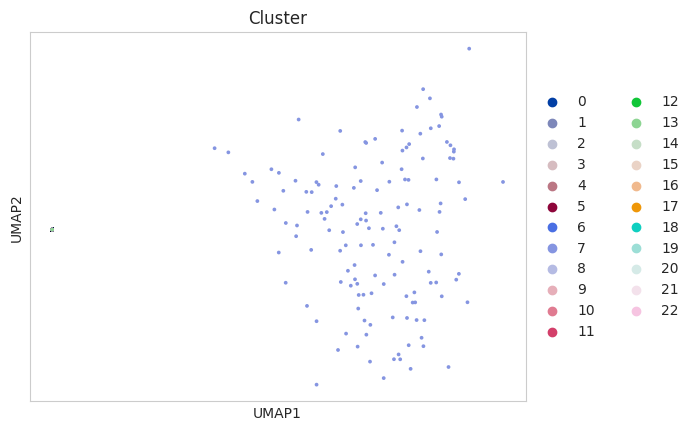

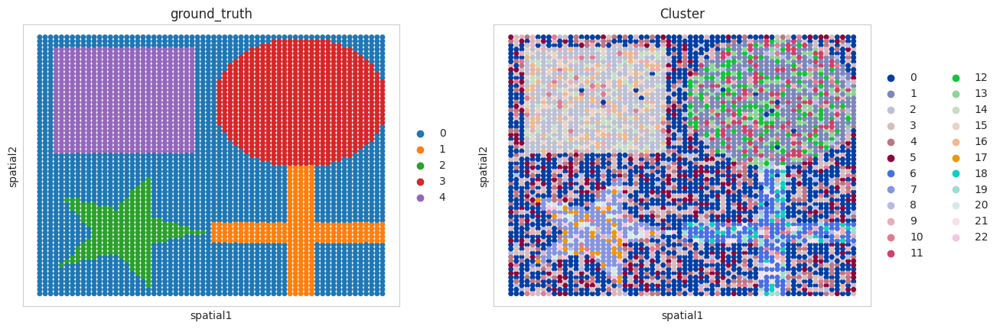

         Falling back to preprocessing with `sc.pp.pca` and default params.


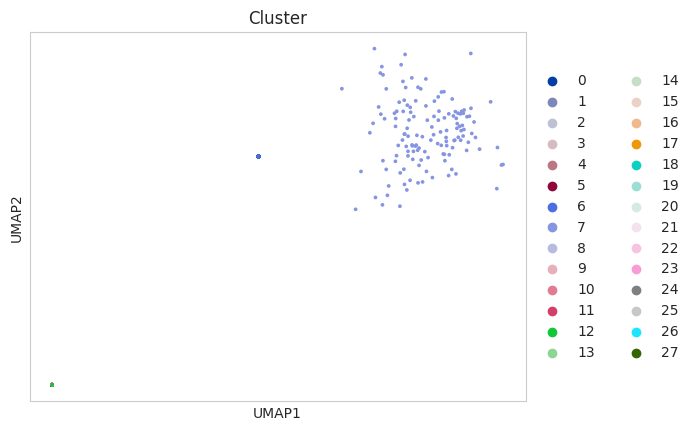

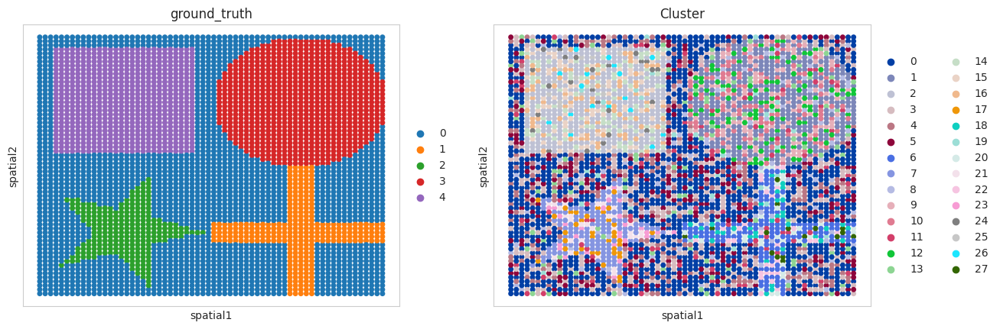

In [181]:
import random
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
from utils import misc, preprocess
dtp = "float32"
random.seed(101)

# Enhanced pattern generation functions
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A

def ggblocks(nside=64, block_size=32):
    """
    Generate large blocky spatial patterns where each pattern is a separate class.
    Includes a five-pointed star pattern.
    - Each pattern occupies a distinct block in the spatial grid
    - block_size must divide nside
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

    # Define pattern generators
    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1
        return A

    def cross_pattern(size, thickness=5):
        A = np.zeros((size, size))
        c = size // 2
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)
        start = max(0, start)
        end = min(size, end)
        A[:, start:end] = 1
        A[start:end, :] = 1
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2
        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1
        return A

    def star_pattern(size):
        """Generate a five-pointed star pattern"""
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        angles = np.linspace(0, 2*np.pi, 6)[:-1]
        star_points = []
        for i, angle in enumerate(angles):
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            inner_angle = angle + 2*np.pi/10
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        star_points = np.array(star_points).astype(int)
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        return A

    patterns = [square_pattern, circle_pattern, star_pattern, cross_pattern]
    output = np.zeros((num_patterns, nside*nside))

    for pattern_idx in range(num_patterns):
        grid = np.zeros((nside, nside))
        row = pattern_idx // n_blocks
        col = pattern_idx % n_blocks
        if row < n_blocks and col < n_blocks:
            start_x = row * block_size
            start_y = col * block_size
            block_pattern = patterns[pattern_idx % len(patterns)](block_size)
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        output[pattern_idx, :] = grid.flatten()

    return output

def quilt(size=12):
    """Original quilt patterns"""
    patterns = [squares(size), crosses(size), circles(size), triangles(size)]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=36):
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, L=3, nzprob=0.2, seed=101):
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=0, Jsp=0, Jmix=500, Jns=0, expr_mean=20.0, mix_frac_spat=0.1, modality='RNA', seed=101):
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    if modality == 'ADT':
        expr_mean = expr_mean
        mix_frac_spat = 0.1
    elif modality == 'ATAC':
        expr_mean = expr_mean
        mix_frac_spat = 0.05
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, mean=2, variance=0.5, seed=101):
    """Add Gaussian noise with specified mean and variance"""
    rng = np.random.default_rng(seed)
    std_dev = np.sqrt(variance)
    noise = rng.normal(mean, std_dev, data.shape)
    return data + noise

def sim_multiomics(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
                  nb_shape=10.0, seed=101, **kwargs):
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=3, nzprob=nzprob_nsp, seed=seed)
    
    adata = AnnData(X=np.empty((N, 0)))
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    modalities = {
        'RNA': {'Jsp': 300, 'Jmix': 2500, 'Jns': 200, 'expr_mean': 20},
        'ADT': {'Jsp': 10, 'Jmix': 80, 'Jns': 10, 'expr_mean': 100},
        'ATAC': {'Jsp': 400, 'Jmix': 3000, 'Jns': 00, 'expr_mean': 5}
    }
    
    for modality, params in modalities.items():
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        if modality == 'ATAC':
            counts = rng.poisson(Lambda)
            zero_mask = rng.random(Lambda.shape) < 0.5
            counts[zero_mask] = 0
        elif modality == "RNA":
            counts = rng.negative_binomial(r, r/(Lambda+r))
            zero_mask = rng.random(Lambda.shape) < 0.3
            counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
            
        
        counts = add_gaussian_noise(counts, mean=2, variance=0.5, seed=modality_seed)
        counts = np.clip(counts, 0, None).astype(int)
        
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    return adata

def sim2anndata(locs, outcome, spfac, spload, nsfac=None, nsload=None):
    obsm = {"spatial": locs, "spfac": spfac, "nsfac": nsfac}
    varm = {"spload": spload, "nsload": nsload}
    ad = AnnData(outcome, obsm=obsm, varm=varm)
    ad.layers = {"counts": ad.X.copy()}
    idx = list(range(ad.shape[0]))
    random.shuffle(idx)
    ad = ad[idx, :]
    return ad

def sim(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
       nb_shape=10.0, seed=101, multiomics=False, **kwargs):
    if multiomics:
        return sim_multiomics(scenario, nside=nside, nzprob_nsp=nzprob_nsp,
                            bkg_mean=bkg_mean, nb_shape=nb_shape,
                            seed=seed, **kwargs)
    else:
        if scenario == "both":
            F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
            F2 = gen_spatial_factors(nside=nside, scenario="quilt")
            F = np.hstack((F1, F2))
        else:
            F = gen_spatial_factors(scenario=scenario, nside=nside)
        
        rng = np.random.default_rng(seed)
        N = nside**2
        X = gen_spatial_coords(N)
        W, V = gen_loadings(F.shape[1], seed=seed, **kwargs)
        U = gen_nonspatial_factors(N, L=V.shape[1], nzprob=nzprob_nsp, seed=seed)
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        Y = rng.negative_binomial(r, r/(Lambda+r))
        Y = add_gaussian_noise(Y, mean=2, variance=0.5, seed=seed)
        Y = np.clip(Y, 0, None).astype(int)
        
        return sim2anndata(X, Y, F, W, nsfac=U, nsload=V)

# Example usage
adata = sim("ggblocks", multiomics=True, nside=64)

def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

labels_S1 = assign_unique_labels(adata.obsm['spfac'])
adata.obs['ground_truth'] = labels_S1
adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')

adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
adata_RNA.obsm['spatial'] = adata.obsm['spatial']
def plot_figure_RNA(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

plot_figure_RNA(adata_RNA, res=0.01)


adata_ADT = AnnData(X=adata.obsm['counts_ADT'], obs=adata.obs)
adata_ADT.obsm['spatial'] = adata.obsm['spatial']
def plot_figure_RNA(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

plot_figure_RNA(adata_ADT, res=0.01)

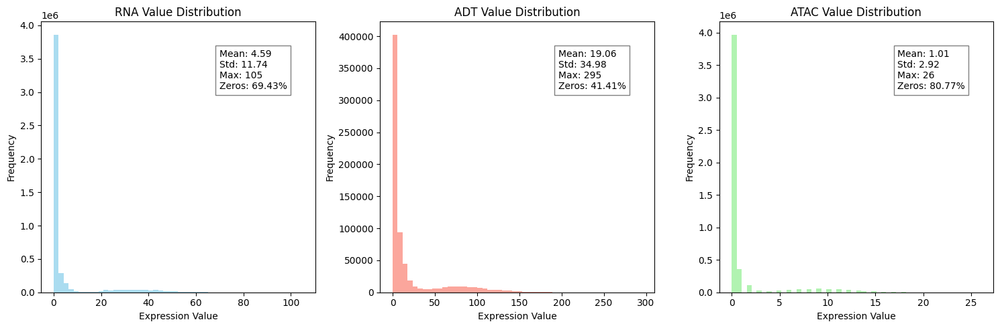

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def plot_value_distribution(adata):
    """
    绘制RNA、ADT和ATAC数值的分布直方图
    """
    plt.figure(figsize=(15, 5))
    
    modalities = ['RNA', 'ADT', 'ATAC']
    colors = ['skyblue', 'salmon', 'lightgreen']
    
    for i, modality in enumerate(modalities):
        if f"counts_{modality}" in adata.obsm:
            # 获取数据并展平
            values = adata.obsm[f"counts_{modality}"].flatten()
            
            # 创建子图
            plt.subplot(1, len(modalities), i+1)
            
            # 绘制直方图
            plt.hist(values, bins=50, color=colors[i], alpha=0.7)
            plt.title(f'{modality} Value Distribution')
            plt.xlabel('Expression Value')
            plt.ylabel('Frequency')
            
            # 添加统计信息
            stats_text = (f'Mean: {np.mean(values):.2f}\n'
                         f'Std: {np.std(values):.2f}\n'
                         f'Max: {np.max(values)}\n'
                         f'Zeros: {100*(values == 0).mean():.2f}%')
            plt.text(0.65, 0.75, stats_text, 
                    transform=plt.gca().transAxes,
                    bbox=dict(facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

# 使用示例
plot_value_distribution(adata)

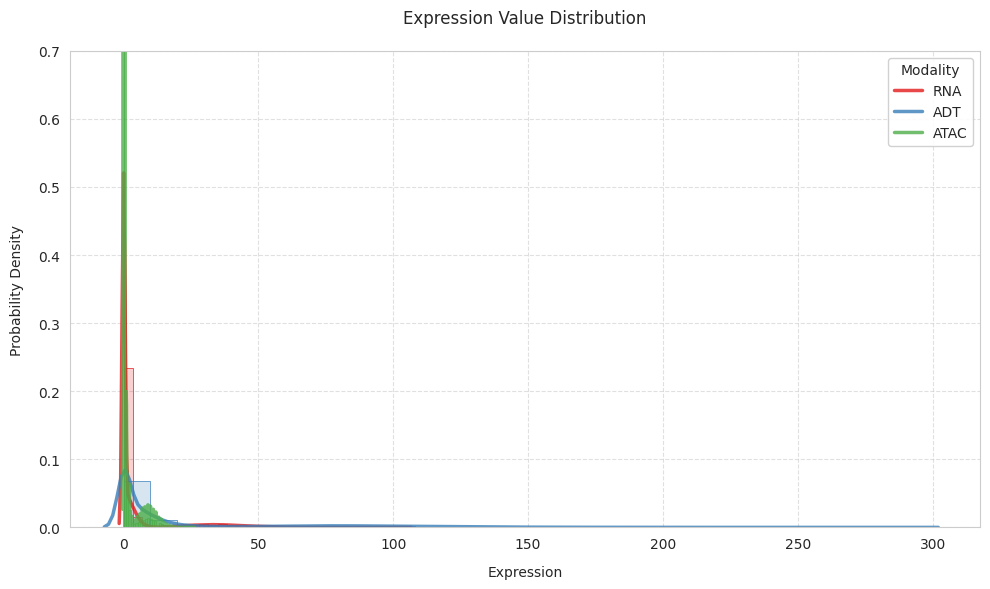

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats

def plot_modality_comparison(adata):
    """
    绘制两个模态的分布对比图（类似截图样式）
    """
    plt.figure(figsize=(10, 6))
    
    # 设置样式
    sns.set_style("whitegrid")
    palette = sns.color_palette("Set1", 3)  # 使用两种对比色
    
    # 准备数据 - 假设adata中有两个模态的数据
    modalities = ['RNA', 'ADT', 'ATAC']
    
    for i, modality in enumerate(modalities):  # 只取前两个模态
        if f"counts_{modality.replace(' ', '_')}" in adata.obsm:
            values = adata.obsm[f"counts_{modality.replace(' ', '_')}"].flatten()
            
            # 绘制密度曲线
            sns.kdeplot(values, color=palette[i], linewidth=2.5, 
                        label=modality, alpha=0.8)
            
            # 添加直方图
            sns.histplot(values, bins=30, color=palette[i], 
                         stat='density', alpha=0.2,
                         edgecolor=palette[i], linewidth=0.5)
    
    # 设置坐标轴范围
    plt.ylim(0, 0.7)  # 匹配截图中的y轴范围
    plt.xlim(left=-20)  # 匹配截图中的x轴起始
    
    # 添加标签和标题
    plt.title('Expression Value Distribution', pad=20)
    plt.xlabel('Expression', labelpad=10)
    plt.ylabel('Probability Density', labelpad=10)
    
    # 调整图例和网格
    plt.legend(title='Modality', frameon=True, framealpha=0.9)
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # 美化布局
    plt.tight_layout()
    plt.show()

# 使用示例
plot_modality_comparison(adata)

8.0
Found 2 unique domains.


Project..: 100%|█| 300/300 [00:24<00


Best resolution:  0.21000000000000005


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.0.0
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


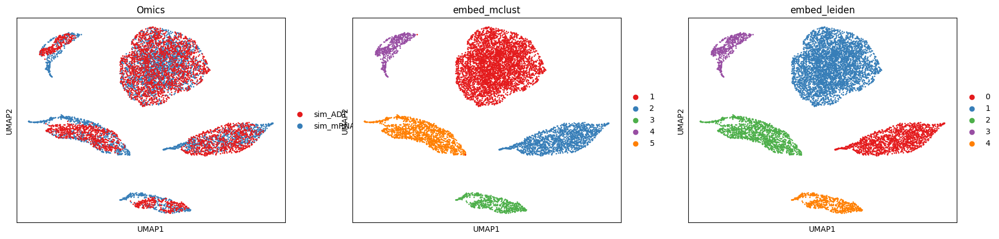

Best resolution:  0.03
fitting ...
  |======================================================================| 100%


[<Axes: title={'center': 'Ground_truth'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Leiden'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Mclust'}, xlabel='spatial1', ylabel='spatial2'>]

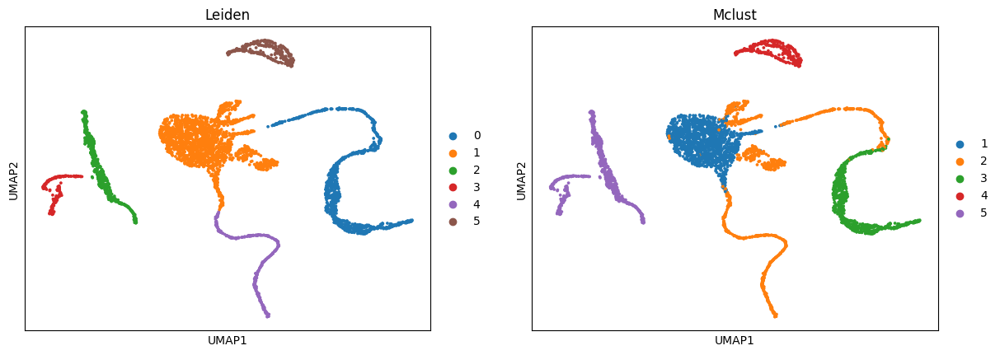

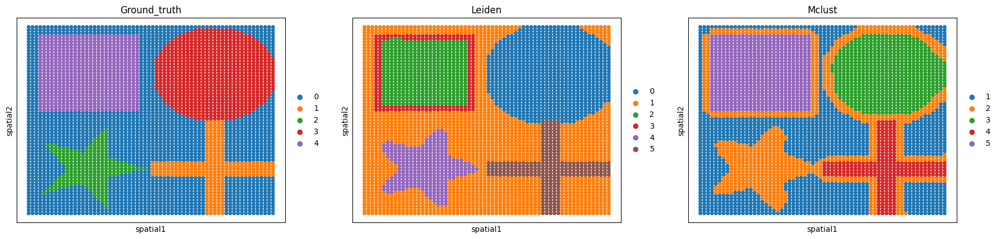

In [1]:
######## 尝试一下DIRAC
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv3 as sd

def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=0)

data_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data"
data_name = "sim"
methods = "DIRAC"
out_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2"

adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, f"{data_name}_ADT.h5ad"))

######### Define colors for spatial multi-omics domain
colormaps= ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#A65628", "#FFFF33", "#F781BF", "#999999",
            "#E5D8BD", "#B3CDE3", "#CCEBC5", "#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", "#CAB2D6","#6A3D9A", "#B15928"]

######### Data processing
adata_RNA.obs["Omics"] = data_name + "_mRNA"
adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
adata_Protein.obs["Omics"] = data_name + "_ADT"
adata_Protein.obs['Omics'] = adata_Protein.obs['Omics'].astype('category')


######### Data processing
sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA)
sc.pp.log1p(adata_RNA)
sc.pp.scale(adata_RNA)
sc.tl.pca(adata_RNA, n_comps=50)


sc.pp.normalize_total(adata_Protein)
sc.pp.log1p(adata_Protein)
sc.pp.scale(adata_Protein)


edge_index = sd.utils.get_single_edge_index(adata_RNA.obsm["spatial"], n_neighbors = 8)
print(len(edge_index)/adata_RNA.shape[0])
edge_index = torch.LongTensor(edge_index).T


y = pd.Categorical(
    np.array(adata_RNA.obs["Omics"]),
    categories=np.unique(adata_RNA.obs["Omics"]),
    ).codes
save_path = os.path.join(out_path, "Results", f"{data_name}_{methods}")
if not os.path.exists(save_path):
    os.makedirs(save_path)


###### Training Dirac for spatial multi-omics
dirac = sd.main.integrate_app(save_path = save_path, 
                              use_gpu = True, 
                              subgraph = False)
samples = dirac._get_data(dataset_list = [adata_RNA.obsm['X_pca'].copy(), adata_Protein.X.copy()],
                        batch_list = [y, y],
                        domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_Protein.shape[0])],
                        edge_index = edge_index)
models = dirac._get_model(samples,
                        n_hiddens = 128,
                        n_outputs = 64,
                        opt_GNN = "GAT",)
data_z, combine_recon, now = dirac._train_dirac_integrate(samples = samples,
                                            models = models,
                                            epochs = 300,
                                            lamb = 5e-4,
                                            scale_loss = 0.025,
                                            lr = 1e-3,
                                            wd = 5e-2)


adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
adata_Protein.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] :, :]
adata_RNA.obsm["combine_recon"] = combine_recon
adata_Protein.obsm["combine_recon"] = combine_recon

n_clusters = 5
adata = anndata.AnnData(data_z)
adata.obs = pd.concat([adata_RNA.obs, adata_Protein.obs])
adata.obsm[f"{methods}_embed"] = data_z
sc.pp.neighbors(adata, use_rep='X')
sc.tl.umap(adata)
res_RNA_ATAC = sd.utils._priori_cluster(adata, eval_cluster_n = n_clusters)
sc.tl.leiden(adata, resolution = res_RNA_ATAC, key_added="embed_leiden", flavor="igraph", n_iterations=2, directed=False)
sd.utils.mclust_R(adata=adata, num_cluster = n_clusters, used_obsm=f"{methods}_embed", key_added="embed_mclust")
sc.pl.umap(adata, color=['Omics', "embed_mclust", "embed_leiden"], palette = colormaps)
# plt.savefig(os.path.join(save_path, f"{data_name}_{methods}_embed_umap_{now}.pdf"), bbox_inches='tight', dpi = 300)


sc.pp.neighbors(adata_RNA, use_rep='combine_recon', n_neighbors=30)
res_RNA_ATAC = sd.utils._priori_cluster(adata_RNA, eval_cluster_n = n_clusters)
sc.tl.leiden(adata_RNA, resolution = res_RNA_ATAC, key_added="Combined_leiden", flavor="igraph", n_iterations=2, directed=False)
sd.utils.mclust_R(adata=adata_RNA, num_cluster = n_clusters, used_obsm="combine_recon",key_added="Combined_mclust")

sc.tl.umap(adata_RNA)

sc.pl.umap(adata_RNA, color=["Combined_leiden",'Combined_mclust'],title=['Leiden','Mclust'], show=False)
sc.pl.embedding(adata_RNA, basis='spatial', color=["ground_truth", "Combined_leiden",'Combined_mclust'], title=['Ground_truth','Leiden','Mclust'], s=100, show=False)

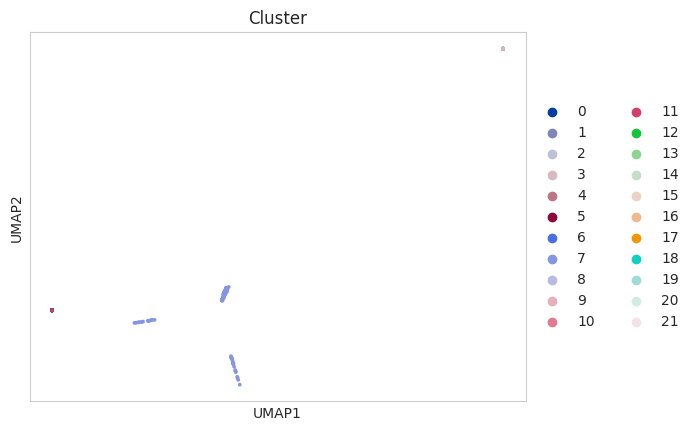

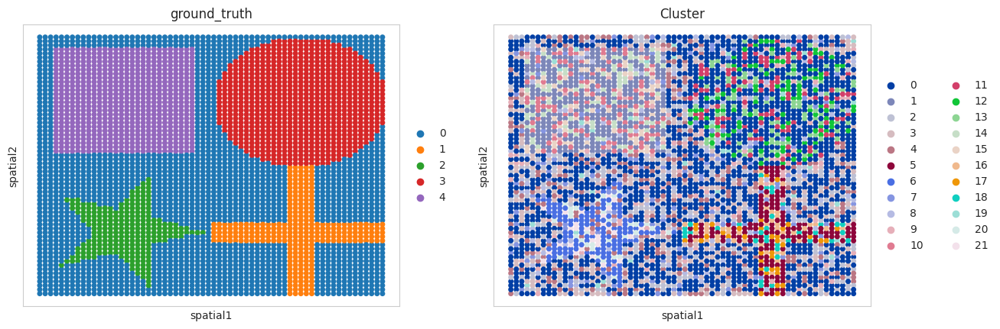

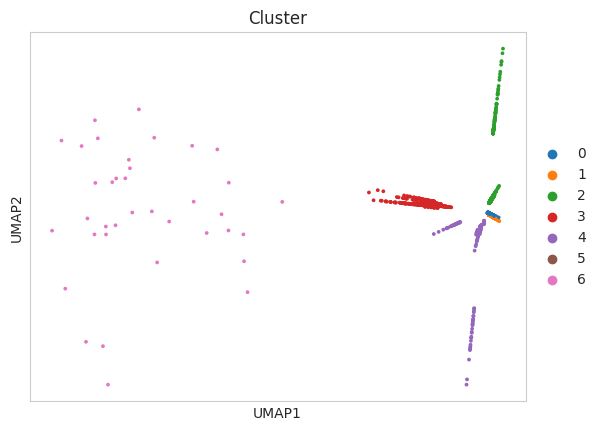

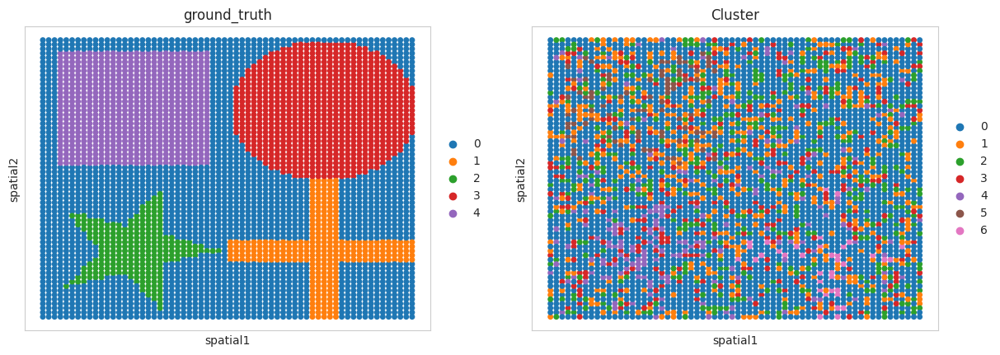

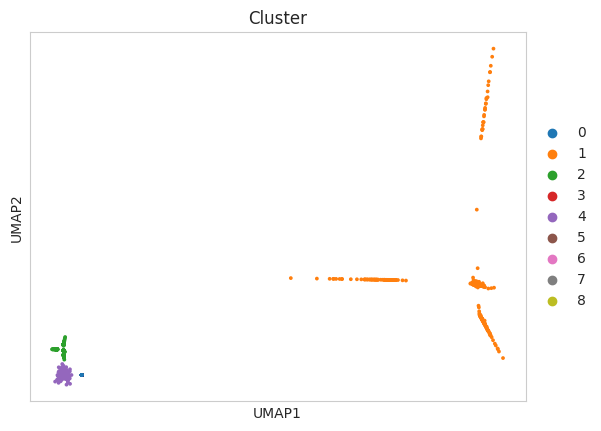

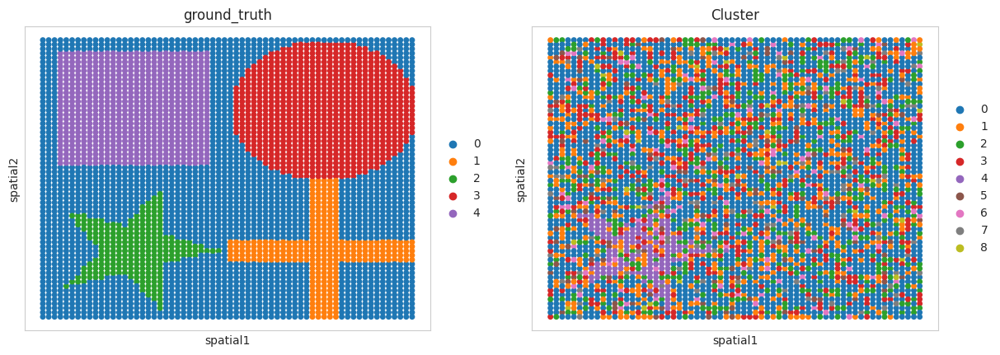

In [27]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Enhanced spatial simulation with multi-omics data generation
"""
import random
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
dtp = "float32"
random.seed(101)
import scanpy as sc
import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")
from utils import misc, preprocess

# Enhanced pattern generation functions
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A


def ggblocks(nside=64, block_size = 32):
    """
    Generate large blocky spatial patterns where each pattern is a separate class.
    Includes a five-pointed star pattern.
    - Each pattern occupies a distinct block in the spatial grid
    - block_size must divide nside
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

    # Define pattern generators
    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1
        return A

    def cross_pattern(size, thickness=5):
        """
        Generate a cross pattern with adjustable thickness.
    
        Parameters:
        -----------
        size : int
            The size of the pattern (size x size)
        thickness : int
            The width of the cross bars (default: 3)
    
        Returns:
        --------
        numpy.ndarray
            A 2D array with the cross pattern
        """
        A = np.zeros((size, size))
        c = size // 2  # Center position
    
        # Calculate bar boundaries
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)  # Handle odd thickness
    
        # Make sure we stay within bounds
        start = max(0, start)
        end = min(size, end)
    
        # Draw thicker cross
        A[:, start:end] = 1  # Vertical bar
        A[start:end, :] = 1  # Horizontal bar
    
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2
        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1
        return A

    def star_pattern(size):
        """Generate a five-pointed star pattern"""
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        
        # Create star polygon coordinates
        angles = np.linspace(0, 2*np.pi, 6)[:-1]  # 5 points
        star_points = []
        for i, angle in enumerate(angles):
            # Outer point
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            # Inner point (for star indentation)
            inner_angle = angle + 2*np.pi/10  # Offset by 36 degrees
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        
        # Convert to integer coordinates
        star_points = np.array(star_points).astype(int)
        
        # Fill the polygon
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        
        return A


    # Replace circle pattern with star pattern
    patterns = [square_pattern, circle_pattern, star_pattern, cross_pattern]
    
    # Initialize output array (num_patterns, nside*nside)
    output = np.zeros((num_patterns, nside*nside))

    for pattern_idx in range(num_patterns):
        # Create empty grid for this pattern
        grid = np.zeros((nside, nside))
        
        # Calculate block position for this pattern
        row = pattern_idx // n_blocks
        col = pattern_idx % n_blocks
        
        # Only place this pattern in its designated block
        if row < n_blocks and col < n_blocks:
            start_x = row * block_size
            start_y = col * block_size
            block_pattern = patterns[pattern_idx % len(patterns)](block_size)
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        
        # Store this pattern's grid
        output[pattern_idx, :] = grid.flatten()

    return output


def quilt(size=12):
    """Original quilt patterns"""
    patterns = [
        squares(size),
        crosses(size),
        circles(size),
        triangles(size)
    ]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=36):
    """
    Generate spatial factors for different scenarios
    """
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    """Generate spatial coordinates"""
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]  # make the display the same
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, L=3, nzprob=0.2, seed=101):
    """Generate non-spatial factors"""
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=3, Jsp=0, Jmix=500, Jns=0, 
                 expr_mean=20.0, mix_frac_spat=0.1, 
                 modality='RNA', seed=101):
    """
    Generate loadings matrix for different modalities
    """
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    # Adjust parameters based on modality
    if modality == 'ADT':
        expr_mean = expr_mean  # ADT typically has higher counts
        mix_frac_spat = 0.2  # ADT often more spatially structured
    elif modality == 'ATAC':
        expr_mean = expr_mean  # ATAC typically has lower counts
        mix_frac_spat = 0.05  # Chromatin accessibility may be less spatially structured
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    # Pure spatial features
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    
    # Mixed features
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    
    # Pure non-spatial features
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, snr=10, seed=101):
    """Add Gaussian noise to data with specified signal-to-noise ratio"""
    rng = np.random.default_rng(seed)
    signal_power = np.mean(data**2)
    noise_power = signal_power / snr
    noise = rng.normal(0, np.sqrt(noise_power), data.shape)
    return data + noise

# def add_gaussian_noise(data, mean=2, variance=0.5, seed=101):
#     """Add Gaussian noise to data with specified mean and variance
    
#     Parameters:
#     -----------
#     data : numpy.ndarray
#         Input data matrix
#     mean : float
#         Mean of the Gaussian noise (default: 2)
#     variance : float
#         Variance of the Gaussian noise (default: 0.5)
#     seed : int
#         Random seed for reproducibility
#     """
#     rng = np.random.default_rng(seed)
#     std_dev = np.sqrt(variance)  # Standard deviation is square root of variance
#     noise = rng.normal(mean, std_dev, data.shape)
#     return data + noise

def sim_multiomics(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
                  nb_shape=10.0, seed=101, **kwargs):
    """
    Simulate multi-omics spatial data (RNA, ADT, ATAC)
    """
    # Generate common spatial structure
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=3, nzprob=nzprob_nsp, seed=seed)
    
    # Initialize empty AnnData object with correct number of observations
    adata = AnnData(X=np.empty((N, 0)))  # Initialize with N obs and 0 vars
    
    # Add spatial coordinates and factors
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    # Simulate each modality
    modalities = {
        'RNA': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 20},
        'ADT': {'Jsp': 50, 'Jmix': 100, 'Jns': 20, 'expr_mean': 100},
        'ATAC': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 10}
    }
    
    for modality, params in modalities.items():
        # Update params with any modality-specific kwargs
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        
        # Generate loadings for this modality
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        # Simulate counts
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        # Different count models for different modalities
        if modality == 'ATAC':
            # ATAC data often has many zeros and follows ZIP or ZINB
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.5  # 30% additional zeros
            counts[zero_mask] = 0
        elif modality == 'RNA':
            counts = rng.negative_binomial(Lambda, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.3
            counts[zero_mask] = 0
        elif modality == 'ADT':
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.01
            counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed = modality_seed)
        
        # Add modality-specific Gaussian noise
        # counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
        counts = np.clip(counts, 0, None).astype(int)
        
        # Store in AnnData layers
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    # Shuffle indices
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    
    return adata

def sim2anndata(locs, outcome, spfac, spload, nsfac=None, nsload=None):
    """
    Compatibility function to match original function signature
    """
    obsm = {"spatial": locs, "spfac": spfac, "nsfac": nsfac}
    varm = {"spload": spload, "nsload": nsload}
    ad = AnnData(outcome, obsm=obsm, varm=varm)
    ad.layers = {"counts": ad.X.copy()}
    idx = list(range(ad.shape[0]))
    random.shuffle(idx)
    ad = ad[idx, :]
    return ad

def sim(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
       nb_shape=10.0, seed=101, multiomics=False, **kwargs):
    """
    Main simulation function that can handle both single and multi-omics
    """
    if multiomics:
        return sim_multiomics(scenario, nside=nside, nzprob_nsp=nzprob_nsp,
                            bkg_mean=bkg_mean, nb_shape=nb_shape,
                            seed=seed, **kwargs)
    else:
        # Original single-modality simulation
        if scenario == "both":
            F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
            F2 = gen_spatial_factors(nside=nside, scenario="quilt")
            F = np.hstack((F1, F2))
        else:
            F = gen_spatial_factors(scenario=scenario, nside=nside)
        
        rng = np.random.default_rng(seed)
        N = nside**2
        X = gen_spatial_coords(N)
        W, V = gen_loadings(F.shape[1], seed=seed, **kwargs)
        U = gen_nonspatial_factors(N, L=V.shape[1], nzprob=nzprob_nsp, seed=seed)
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        Y = rng.negative_binomial(r, r/(Lambda+r))
        Y = add_gaussian_noise(Y, snr=20, seed=seed)
        Y = np.clip(Y, 0, None).astype(int)
        
        return sim2anndata(X, Y, F, W, nsfac=U, nsload=V)

adata = sim("ggblocks", multiomics=True, nside=64, seed=1)

def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

labels_S1 = assign_unique_labels(adata.obsm['spfac'])
adata.obs['ground_truth'] = labels_S1
adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')
# sc.pl.embedding(adata, basis='spatial', color=['ground_truth'], s=100)

adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
adata_RNA.obsm['spatial'] = adata.obsm['spatial']
adata_ADT = AnnData(X=adata.obsm['counts_ADT'], obs=adata.obs)
adata_ADT.obsm['spatial'] = adata.obsm['spatial']
adata_ATAC = AnnData(X=adata.obsm['counts_ATAC'], obs=adata.obs)
adata_ATAC.obsm['spatial'] = adata.obsm['spatial']

# adata_RNA.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_RNA.h5ad")
# adata_ATAC.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_ATAC.h5ad")
# adata_ADT.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_ADT.h5ad")

def plot_figure(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

plot_figure(adata_RNA, res=0.000001)
plot_figure(adata_ADT, res=0.001)
plot_figure(adata_ATAC, res=0.00001)

In [28]:
zero_counts = (adata.obsm['counts_ADT'] == 0).sum(axis=1)

print(zero_counts)

[63 83 64 ... 56 90 73]


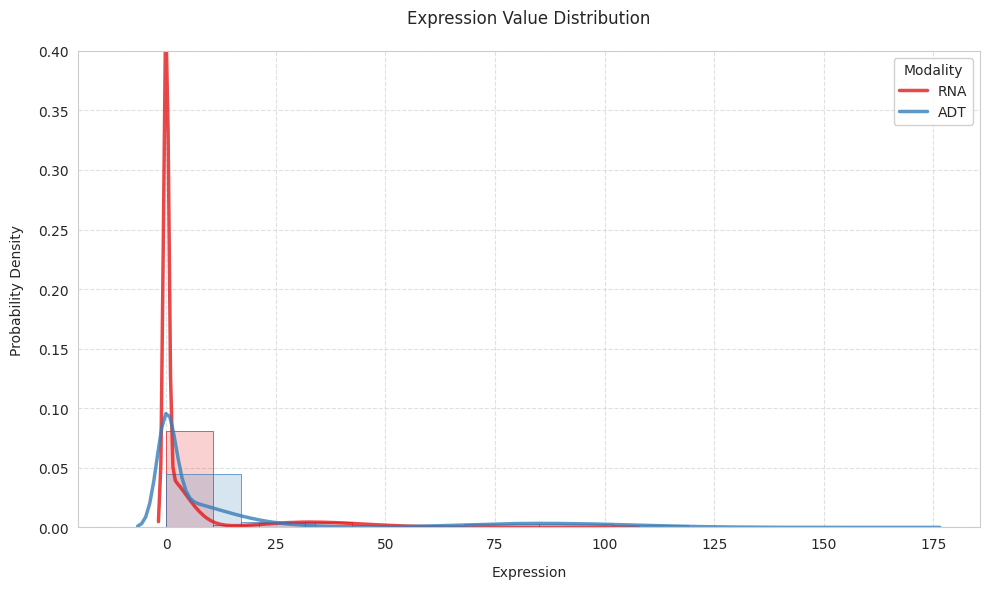

In [29]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats

def plot_modality_comparison(adata):
    """
    绘制两个模态的分布对比图
    """
    plt.figure(figsize=(10, 6))
    
    # 设置样式
    sns.set_style("whitegrid")
    palette = sns.color_palette("Set1", 3)
    
    # 准备数据 - 假设adata中有两个模态的数据
    modalities = ['RNA', 'ADT']
    
    for i, modality in enumerate(modalities):  # 只取前两个模态
        if f"counts_{modality.replace(' ', '_')}" in adata.obsm:
            values = adata.obsm[f"counts_{modality.replace(' ', '_')}"].flatten()
            
            # 绘制密度曲线
            sns.kdeplot(values, color=palette[i], linewidth=2.5, 
                        label=modality, alpha=0.8)
            
            # 添加直方图
            sns.histplot(values, bins=10, color=palette[i], 
                         stat='density', alpha=0.2,
                         edgecolor=palette[i], linewidth=0.5)
    
    # 设置坐标轴范围
    plt.ylim(0, 0.4)  # 匹配截图中的y轴范围
    plt.xlim(left=-20)  # 匹配截图中的x轴起始
    
    # 添加标签和标题
    plt.title('Expression Value Distribution', pad=20)
    plt.xlabel('Expression', labelpad=10)
    plt.ylabel('Probability Density', labelpad=10)
    
    # 调整图例和网格
    plt.legend(title='Modality', frameon=True, framealpha=0.9)
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # 美化布局
    plt.tight_layout()
    plt.show()

# 使用示例
plot_modality_comparison(adata)

In [9]:
import random
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
dtp = "float32"
random.seed(101)
import scanpy as sc
from pathlib import Path
import os
import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")
from utils import misc, preprocess

# Enhanced pattern generation functions with more patterns
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A

def diamonds(size=12):
    """Generate diamond patterns"""
    A = np.zeros((size, size))
    center = size // 2
    for i in range(size):
        for j in range(size):
            if abs(i - center) + abs(j - center) < center:
                A[i, j] = 1
    return A

def waves(size=12):
    """Generate wave patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if np.sin(2 * np.pi * j / size) > 0.5:
                A[i, j] = 1
    return A


# def ggblocks(nside=64, block_size=32, num_patterns=4, random_seed=None):
#     """
#     Generate large blocky spatial patterns that fill the entire space.
#     Randomly selects 'num_patterns' from available patterns to fill the space.
    
#     Parameters:
#         nside: grid size (nside x nside)
#         block_size: size of each pattern block
#         num_patterns: number of distinct patterns to use (default 9)
#         random_seed: random seed for reproducibility
#     Returns:
#         (num_patterns, nside*nside) array where each row is one pattern
#     """
#     if nside % block_size != 0:
#         raise ValueError("nside must be divisible by block_size")

#     if random_seed is not None:
#         np.random.seed(random_seed)

#     n_blocks = nside // block_size
#     total_blocks = n_blocks**2

#     # Define ALL available pattern generators (16 patterns)
#     def square_pattern(size):
#         A = np.zeros((size, size))
#         q = size // 10
#         A[q:-q, q:-q] = 1
#         return A

#     def cross_pattern(size, thickness=5):
#         A = np.zeros((size, size))
#         c = size // 2
#         half_thickness = thickness // 2
#         start = c - half_thickness
#         end = c + half_thickness + (thickness % 2)
#         start = max(0, start)
#         end = min(size, end)
#         A[:, start:end] = 1
#         A[start:end, :] = 1
#         return A

#     def diag_pattern(size):
#         A = np.eye(size)
#         A += np.fliplr(np.eye(size))
#         return (A > 0).astype(float)

#     def circle_pattern(size):
#         A = np.zeros((size, size))
#         r = size // 2
#         cx, cy = size // 2, size // 2
#         for i in range(size):
#             for j in range(size):
#                 if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
#                     A[i, j] = 1
#         return A

#     def star_pattern(size):
#         A = np.zeros((size, size))
#         center = size // 2
#         radius = size // 2 - 2
#         angles = np.linspace(0, 2*np.pi, 6)[:-1]
#         star_points = []
#         for i, angle in enumerate(angles):
#             x = center + radius * np.cos(angle)
#             y = center + radius * np.sin(angle)
#             star_points.append((x, y))
#             inner_angle = angle + 2*np.pi/10
#             x = center + (radius/2.5) * np.cos(inner_angle)
#             y = center + (radius/2.5) * np.sin(inner_angle)
#             star_points.append((x, y))
#         star_points = np.array(star_points).astype(int)
#         from matplotlib.path import Path
#         x, y = np.meshgrid(np.arange(size), np.arange(size))
#         points = np.vstack((x.flatten(), y.flatten())).T
#         path = Path(star_points)
#         mask = path.contains_points(points)
#         A = mask.reshape(size, size).astype(float)
#         return A

#     def spiral_pattern(size):
#         A = np.zeros((size, size))
#         center = size // 2
#         for i in range(size):
#             for j in range(size):
#                 r = np.sqrt((i - center)**2 + (j - center)**2)
#                 theta = np.arctan2(j - center, i - center)
#                 if r < center and np.sin(5 * theta + r) > 0.5:
#                     A[i, j] = 1
#         return A

#     def heart_pattern(size):
#         A = np.zeros((size, size))
#         center = size // 2
#         scale = size / 4
#         for i in range(size):
#             for j in range(size):
#                 x = (i - center) / scale
#                 y = (j - center) / scale
#                 if (x**2 + y**2 - 1)**3 - x**2 * y**3 < 0:
#                     A[i, j] = 1
#         return A

#     def maze_pattern(size):
#         A = np.zeros((size, size))
#         for i in range(size):
#             for j in range(size):
#                 if (i % 4 == 0) or (j % 4 == 0 and (i // 4 + j // 4) % 2 == 0):
#                     A[i, j] = 1
#         return A

#     def concentric_circles(size):
#         A = np.zeros((size, size))
#         center = size // 2
#         for i in range(size):
#             for j in range(size):
#                 r = np.sqrt((i - center)**2 + (j - center)**2)
#                 if r % 5 < 2.5:
#                     A[i, j] = 1
#         return A

#     def checkerboard_large(size):
#         A = np.zeros((size, size))
#         for i in range(size):
#             for j in range(size):
#                 if (i // 3 + j // 3) % 2 == 0:
#                     A[i, j] = 1
#         return A

#     def stripes_diagonal(size):
#         A = np.zeros((size, size))
#         for i in range(size):
#             for j in range(size):
#                 if (i + j) % 4 < 2:
#                     A[i, j] = 1
#         return A

#     def dots_pattern(size):
#         A = np.zeros((size, size))
#         for i in range(2, size, 5):
#             for j in range(2, size, 5):
#                 A[i, j] = 1
#         return A
        
#     def crescent_moon(size):
#         A = np.zeros((size, size))
#         center = size // 2
#         outer_r = size // 2 - 2
#         inner_r = outer_r - size // 5
#         for i in range(size):
#             for j in range(size):
#                 d = np.sqrt((i-center)**2 + (j-center)**2)
#                 angle = np.arctan2(j-center, i-center)
#                 if d < outer_r and not (d < inner_r and angle > -np.pi/2 and angle < np.pi/2):
#                     A[i,j] = 1
#         return A

#     def fibonacci_spiral(size):
#         A = np.zeros((size, size))
#         center = size // 2
#         scale = size / 3
#         phi = (1 + np.sqrt(5)) / 2
#         golden_angle = 2 * np.pi * (2 - phi)
#         n_points = 100
#         angles = golden_angle * np.arange(n_points)
#         radii = scale * np.sqrt(np.arange(n_points) / np.sqrt(n_points))
#         points = np.array([
#             center + radii * np.cos(angles),
#             center + radii * np.sin(angles)
#         ]).T.astype(int)
#         for i in range(len(points)-1):
#             x1, y1 = points[i]
#             x2, y2 = points[i+1]
#             steps = max(abs(x2-x1), abs(y2-y1)) + 1
#             for t in np.linspace(0, 1, steps):
#                 x = int(round(x1 + t*(x2-x1)))
#                 y = int(round(y1 + t*(y2-y1)))
#                 if 0 <= x < size and 0 <= y < size:
#                     A[x, y] = 1      
#         return A

#     def cellular_automata(size, rule=30, random_init=True):
#         A = np.zeros((size, size), dtype=int)
#         if random_init:
#             A[0, :] = np.random.randint(0, 2, size)
#         else:
#             A[0, size//2] = 1
#         rule_bits = np.array([int(b) for b in f"{rule:08b}"[::-1]])
#         for i in range(1, size):
#             for j in range(size):
#                 left = A[i-1, (j-1)%size]
#                 center = A[i-1, j]
#                 right = A[i-1, (j+1)%size]
#                 neighborhood = (left << 2) | (center << 1) | right
#                 A[i, j] = rule_bits[neighborhood]
#         return A

#     def fractal_tree(size):
#         A = np.zeros((size, size))
#         start_x, start_y = size//2, size-5
#         branch_length = size // 3
        
#         def draw_branch(x, y, length, angle, thickness):
#             if length < 2:
#                 return
#             end_x = x - length * np.sin(angle)
#             end_y = y - length * np.cos(angle)
#             steps = max(abs(int(end_x-x)), abs(int(end_y-y))) + 1
#             for t in np.linspace(0, 1, steps):
#                 tx = x + t*(end_x-x)
#                 ty = y + t*(end_y-y)
#                 for dx in range(-thickness, thickness+1):
#                     for dy in range(-thickness, thickness+1):
#                         nx, ny = int(tx+dx), int(ty+dy)
#                         if 0 <= nx < size and 0 <= ny < size:
#                             A[nx, ny] = 1
#             new_length = length * 0.7
#             new_thickness = max(1, thickness-1)
#             draw_branch(end_x, end_y, new_length, angle-np.pi/5, new_thickness)
#             draw_branch(end_x, end_y, new_length, angle+np.pi/5, new_thickness)
        
#         draw_branch(start_x, start_y, branch_length, 0, 2)
#         return A

#     # All available patterns
#     all_patterns = [
#         square_pattern, 
#         circle_pattern, 
#         star_pattern, 
#         cross_pattern,
#         spiral_pattern,
#         heart_pattern,
#         maze_pattern,
#         diag_pattern,
#         concentric_circles,
#         checkerboard_large,
#         stripes_diagonal,
#         dots_pattern,
#         crescent_moon,      
#         fibonacci_spiral,   
#         cellular_automata,  
#         fractal_tree        
#     ]
    
#     # Randomly select 'num_patterns' distinct patterns
#     selected_indices = np.random.choice(len(all_patterns), num_patterns, replace=False)
#     patterns = [all_patterns[i] for i in selected_indices]
    
#     # Initialize output array (num_patterns, nside*nside)
#     output = np.zeros((num_patterns, nside*nside))

#     # Fill ALL blocks with randomly selected patterns
#     for block_row in range(n_blocks):
#         for block_col in range(n_blocks):
#             pattern_idx = block_row * n_blocks + block_col
#             grid = np.zeros((nside, nside))
            
#             start_x = block_row * block_size
#             start_y = block_col * block_size
            
#             # Select pattern for this block (cycling through selected patterns)
#             selected_pattern = patterns[pattern_idx % num_patterns]
            
#             # Generate the pattern (with size adjustment if needed)
#             if selected_pattern == cellular_automata:
#                 block_pattern = cellular_automata(block_size, random_init=True)
#             else:
#                 block_pattern = selected_pattern(block_size)
            
#             grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
            
#             # Store this pattern's grid
#             output[pattern_idx, :] = grid.flatten()

#     return output

def ggblocks(nside=128, block_size=32):
    """
    Generate large blocky spatial patterns that fill the entire space.
    Each block gets a unique pattern.
    - nside: grid size (nside x nside)
    - block_size: size of each pattern block
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = n_blocks**2  # Now we use ALL blocks

    # Define pattern generators (expanded to 12 patterns)
    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1
        return A

    def cross_pattern(size, thickness=5):
        A = np.zeros((size, size))
        c = size // 2
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)
        start = max(0, start)
        end = min(size, end)
        A[:, start:end] = 1
        A[start:end, :] = 1
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2
        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1
        return A

    def star_pattern(size):
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        angles = np.linspace(0, 2*np.pi, 6)[:-1]
        star_points = []
        for i, angle in enumerate(angles):
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            inner_angle = angle + 2*np.pi/10
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        star_points = np.array(star_points).astype(int)
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        return A

    def spiral_pattern(size):
        A = np.zeros((size, size))
        center = size // 2
        for i in range(size):
            for j in range(size):
                r = np.sqrt((i - center)**2 + (j - center)**2)
                theta = np.arctan2(j - center, i - center)
                if r < center and np.sin(5 * theta + r) > 0.5:
                    A[i, j] = 1
        return A

    def heart_pattern(size):
        A = np.zeros((size, size))
        center = size // 2
        scale = size / 4
        for i in range(size):
            for j in range(size):
                x = (i - center) / scale
                y = (j - center) / scale
                if (x**2 + y**2 - 1)**3 - x**2 * y**3 < 0:
                    A[i, j] = 1
        return A

    def maze_pattern(size):
        A = np.zeros((size, size))
        for i in range(size):
            for j in range(size):
                if (i % 4 == 0) or (j % 4 == 0 and (i // 4 + j // 4) % 2 == 0):
                    A[i, j] = 1
        return A

    def concentric_circles(size):
        A = np.zeros((size, size))
        center = size // 2
        for i in range(size):
            for j in range(size):
                r = np.sqrt((i - center)**2 + (j - center)**2)
                if r % 5 < 2.5:
                    A[i, j] = 1
        return A

    def checkerboard_large(size):
        A = np.zeros((size, size))
        for i in range(size):
            for j in range(size):
                if (i // 3 + j // 3) % 2 == 0:
                    A[i, j] = 1
        return A

    def stripes_diagonal(size):
        A = np.zeros((size, size))
        for i in range(size):
            for j in range(size):
                if (i + j) % 4 < 2:
                    A[i, j] = 1
        return A

    def dots_pattern(size):
        A = np.zeros((size, size))
        for i in range(2, size, 5):
            for j in range(2, size, 5):
                A[i, j] = 1
        return A
        
    def crescent_moon(size):
        """新月形图案"""
        A = np.zeros((size, size))
        center = size // 2
        outer_r = size // 2 - 2
        inner_r = outer_r - size // 5
        for i in range(size):
            for j in range(size):
                d = np.sqrt((i-center)**2 + (j-center)**2)
                angle = np.arctan2(j-center, i-center)
                if d < outer_r and not (d < inner_r and angle > -np.pi/2 and angle < np.pi/2):
                    A[i,j] = 1
        return A

    def fibonacci_spiral(size):
        A = np.zeros((size, size))
        center = size // 2
        scale = size / 3  # 调整缩放比例
    
        # 黄金角度 = 2π / φ^2 ≈ 137.507764° (其中φ是黄金比例)
        phi = (1 + np.sqrt(5)) / 2  # 黄金比例 ≈ 1.618
        golden_angle = 2 * np.pi * (2 - phi)  # 正确的黄金角度计算
    
        n_points = 100  # 螺旋点的数量
        angles = golden_angle * np.arange(n_points)  # 使用累积黄金角度
    
        # 斐波那契螺旋的半径增长规律
        radii = scale * np.sqrt(np.arange(n_points) / np.sqrt(n_points))
    
        # 转换为坐标
        points = np.array([
            center + radii * np.cos(angles),
            center + radii * np.sin(angles)
        ]).T.astype(int)
    
        # 绘制连接线（确保在数组边界内）
        for i in range(len(points)-1):
            x1, y1 = points[i]
            x2, y2 = points[i+1]
            steps = max(abs(x2-x1), abs(y2-y1)) + 1
            for t in np.linspace(0, 1, steps):
                x = int(round(x1 + t*(x2-x1)))
                y = int(round(y1 + t*(y2-y1)))
                if 0 <= x < size and 0 <= y < size:
                    A[x, y] = 1      
        return A

    def cellular_automata(size, rule=30, random_init=True):
        """
        修正后的细胞自动机模式生成器
        参数：
            size: 图案尺寸 (size x size)
            rule: 自动机规则 (默认30)
            random_init: 是否随机初始化第一行
        返回：
            size x size的二维数组
        """
        A = np.zeros((size, size), dtype=int)
    
        # 初始化第一行
        if random_init:
            A[0, :] = np.random.randint(0, 2, size)
        else:
            A[0, size//2] = 1  # 中间单点初始化
    
        # 将规则转换为二进制表示
        rule_bits = np.array([int(b) for b in f"{rule:08b}"[::-1]])
    
        for i in range(1, size):
            for j in range(size):
                # 处理周期性边界条件
                left = A[i-1, (j-1)%size]
                center = A[i-1, j]
                right = A[i-1, (j+1)%size]
            
                # 计算3位二进制对应的十进制值
                neighborhood = (left << 2) | (center << 1) | right
            
                # 应用规则
                A[i, j] = rule_bits[neighborhood]
    
        return A

    def fractal_tree(size):
        A = np.zeros((size, size))
        start_x, start_y = size//2, size-5
        branch_length = size // 3
        
        def draw_branch(x, y, length, angle, thickness):
            if length < 2:
                return
            end_x = x - length * np.sin(angle)
            end_y = y - length * np.cos(angle)
            steps = max(abs(int(end_x-x)), abs(int(end_y-y))) + 1
            for t in np.linspace(0, 1, steps):
                tx = x + t*(end_x-x)
                ty = y + t*(end_y-y)
                for dx in range(-thickness, thickness+1):
                    for dy in range(-thickness, thickness+1):
                        nx, ny = int(tx+dx), int(ty+dy)
                        if 0 <= nx < size and 0 <= ny < size:
                            A[nx, ny] = 1
            new_length = length * 0.7
            new_thickness = max(1, thickness-1)
            draw_branch(end_x, end_y, new_length, angle-np.pi/5, new_thickness)
            draw_branch(end_x, end_y, new_length, angle+np.pi/5, new_thickness)
        
        draw_branch(start_x, start_y, branch_length, 0, 2)
        return A

    patterns = [
        square_pattern, 
        circle_pattern, 
        star_pattern, 
        cross_pattern,
        spiral_pattern,
        heart_pattern,
        maze_pattern,
        diag_pattern,
        concentric_circles,
        checkerboard_large,
        stripes_diagonal,
        dots_pattern,
        crescent_moon,      
        fibonacci_spiral,   
        cellular_automata,  
        fractal_tree,        
    ]
    
    # Initialize output array (num_patterns, nside*nside)
    output = np.zeros((num_patterns, nside*nside))

    # Fill ALL blocks with patterns
    for block_row in range(n_blocks):
        for block_col in range(n_blocks):
            pattern_idx = block_row * n_blocks + block_col
            grid = np.zeros((nside, nside))
            
            start_x = block_row * block_size
            start_y = block_col * block_size
            
            # Use different patterns for each block
            selected_pattern = patterns[pattern_idx % len(patterns)]
            block_pattern = selected_pattern(block_size)
            
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
            
            # Store this pattern's grid
            output[pattern_idx, :] = grid.flatten()

    return output

def quilt(size=12):
    """Original quilt patterns with more patterns"""
    patterns = [
        squares(size),
        crosses(size),
        circles(size),
        triangles(size),
        stripes(size),
        checkerboards(size),
        diamonds(size),
        waves(size)
    ]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=128):
    """
    Generate spatial factors for different scenarios with larger grid
    """
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    """Generate spatial coordinates"""
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]  # make the display the same
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, L=5, nzprob=0.2, seed=101):
    """Generate non-spatial factors with more factors"""
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=5, Jsp=0, Jmix=500, Jns=0, 
                 expr_mean=20.0, mix_frac_spat=0.1, 
                 modality='RNA', seed=101):
    """
    Generate loadings matrix for different modalities with more features
    """
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    # Adjust parameters based on modality
    if modality == 'ADT':
        expr_mean = expr_mean * 5  # ADT typically has higher counts
        mix_frac_spat = 0.2  # ADT often more spatially structured
    elif modality == 'ATAC':
        expr_mean = expr_mean  # ATAC typically has lower counts
        mix_frac_spat = 0.05  # Chromatin accessibility may be less spatially structured
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    # Pure spatial features
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    
    # Mixed features
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    
    # Pure non-spatial features
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, snr=10, seed=101):
    """Add Gaussian noise to data with specified signal-to-noise ratio"""
    rng = np.random.default_rng(seed)
    signal_power = np.mean(data**2)
    noise_power = signal_power / snr
    noise = rng.normal(0, np.sqrt(noise_power), data.shape)
    return data + noise

def sim_multiomics(scenario, nside=64, nzprob_nsp=0.2, bkg_mean=0.2, 
                  nb_shape=10.0, seed=101, **kwargs):
    """
    Simulate multi-omics spatial data (RNA, ADT, ATAC) with larger grid
    """
    # Generate common spatial structure
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=5, nzprob=nzprob_nsp, seed=seed)
    
    # Initialize empty AnnData object with correct number of observations
    adata = AnnData(X=np.empty((N, 0)))  # Initialize with N obs and 0 vars
    
    # Add spatial coordinates and factors
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    # Simulate each modality with more features
    modalities = {
        'RNA': {'Jsp': 500, 'Jmix': 2000, 'Jns': 500, 'expr_mean': 20},
        'ADT': {'Jsp': 10, 'Jmix': 80, 'Jns': 10, 'expr_mean': 100},
        'ATAC': {'Jsp': 1000, 'Jmix': 3000, 'Jns': 1000, 'expr_mean': 10}
    }
    
    for modality, params in modalities.items():
        # Update params with any modality-specific kwargs
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        
        # Generate loadings for this modality
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        # Simulate counts
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        # Different count models for different modalities
        if modality == 'ATAC':
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed=modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.5  # 50% additional zeros
            counts[zero_mask] = 0
        elif modality == 'RNA':
            counts = rng.negative_binomial(Lambda, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed=modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.3
            counts[zero_mask] = 0
        elif modality == 'ADT':
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed=modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.01
            counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed=modality_seed)
        
        counts = np.clip(counts, 0, None).astype(int)
        
        # Store in AnnData layers
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    # Shuffle indices
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    
    return adata

def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

def generate_and_save_datasets(num_datasets=5, output_dir="simulated_datasets"):
    """Generate multiple datasets and save them to disk"""
    # Create output directory if it doesn't exist
    Path(output_dir).mkdir(parents=True, exist_ok=True)
    
    for i in range(num_datasets):
        print(f"Generating dataset {i+1}/{num_datasets}")
        
        # Vary parameters slightly for each dataset
        nside = 128  # Larger grid (128x128 = 16,384 cells)
        seed = 101 + i  # Different seed for each dataset
        
        # Generate the dataset
        adata = sim_multiomics("ggblocks", multiomics=True, 
                              nside=nside, seed=seed,
                              RNA={'expr_mean': 20 + i*2},
                              ADT={'expr_mean': 100 + i*10},
                              ATAC={'expr_mean': 10 + i})
        
        # Assign ground truth labels
        labels_S1 = assign_unique_labels(adata.obsm['spfac'])
        adata.obs['ground_truth'] = labels_S1
        adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')
        
        # Split into modalities and save
        dataset_dir = Path(output_dir) / f"dataset_{i+1}"
        dataset_dir.mkdir(exist_ok=True)
        
        adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
        adata_RNA.obsm['spatial'] = adata.obsm['spatial']
        
        adata_ADT = AnnData(X=adata.obsm['counts_ADT'], obs=adata.obs)
        adata_ADT.obsm['spatial'] = adata.obsm['spatial']
        
        adata_ATAC = AnnData(X=adata.obsm['counts_ATAC'], obs=adata.obs)
        adata_ATAC.obsm['spatial'] = adata.obsm['spatial']
        
        # Save each modality
        adata_RNA.write(dataset_dir / "sim_RNA.h5ad")
        adata_ATAC.write(dataset_dir / "sim_ATAC.h5ad")
        adata_ADT.write(dataset_dir / "sim_ADT.h5ad")
        
        print(f"Saved dataset {i+1} to {dataset_dir}")

def plot_figure(ad, res=0.1):
    """Visualization function for quality check"""
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution=res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=20)

# Generate and save multiple datasets
generate_and_save_datasets(num_datasets=5, output_dir="/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics")

# Example of loading and visualizing one dataset
# adata_RNA = sc.read("simulated_datasets/dataset_1/sim_RNA.h5ad")
# plot_figure(adata_RNA, res=0.000001)

Generating dataset 1/5
Saved dataset 1 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/dataset_1
Generating dataset 2/5
Saved dataset 2 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/dataset_2
Generating dataset 3/5
Saved dataset 3 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/dataset_3
Generating dataset 4/5
Saved dataset 4 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/dataset_4
Generating dataset 5/5
Saved dataset 5 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/dataset_5


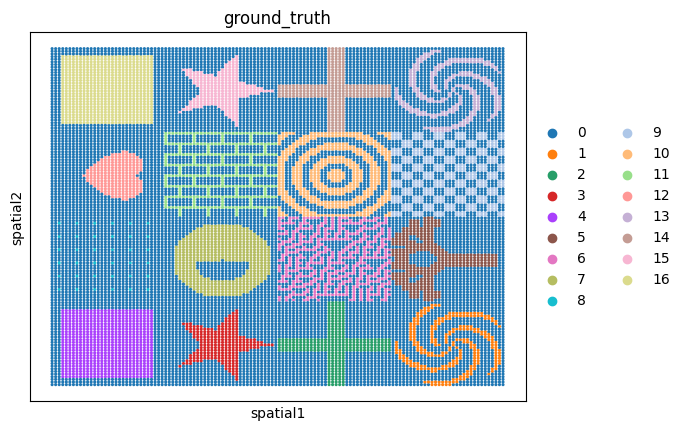

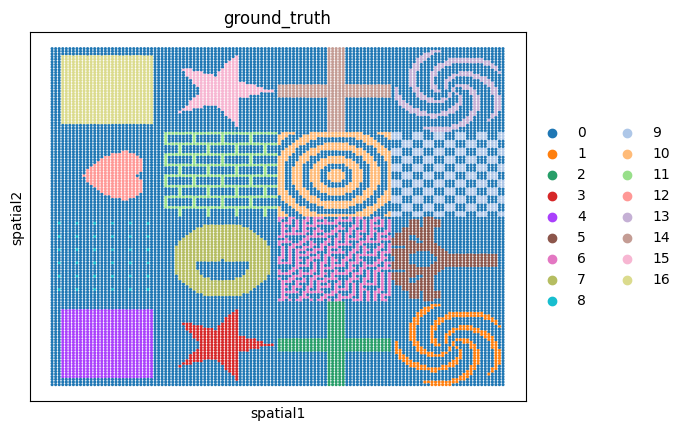

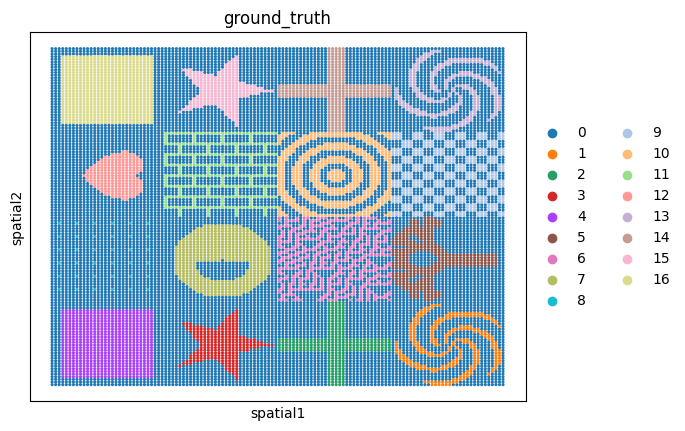

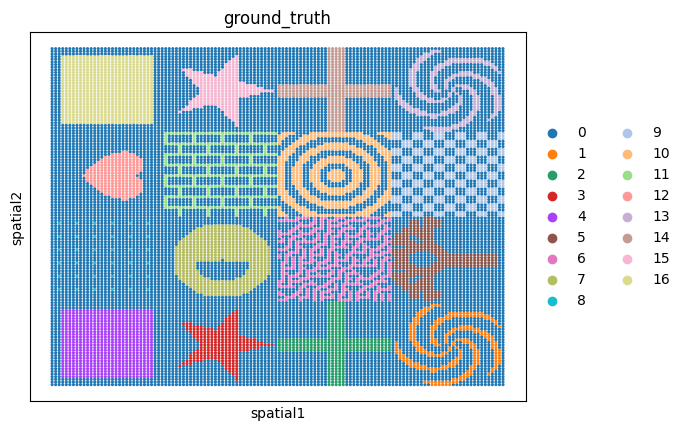

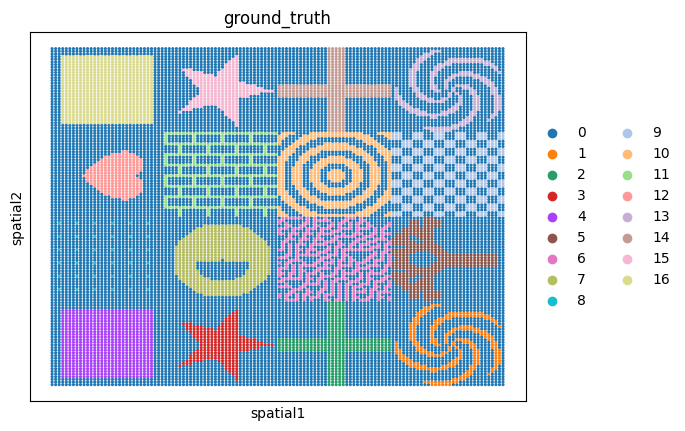

In [2]:
import os
out_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics"
for i in range(5):
    ad = sc.read(os.path.join(out_path,f"dataset_{i+1}","sim_RNA.h5ad"))
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth'], s=20)
    

In [7]:
######## 尝试一下DIRAC
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv3 as sd

def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=0)

data_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/dataset_1"
data_name = "sim"
methods = "DIRAC"
out_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-2"

adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, f"{data_name}_ADT.h5ad"))

######### Define colors for spatial multi-omics domain
colormaps= ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#A65628", "#FFFF33", "#F781BF", "#999999",
            "#E5D8BD", "#B3CDE3", "#CCEBC5", "#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", "#CAB2D6","#6A3D9A", "#B15928"]

######### Data processing
adata_RNA.obs["Omics"] = data_name + "_mRNA"
adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
adata_Protein.obs["Omics"] = data_name + "_ADT"
adata_Protein.obs['Omics'] = adata_Protein.obs['Omics'].astype('category')


######### Data processing
sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA)
sc.pp.log1p(adata_RNA)
sc.pp.scale(adata_RNA)
sc.tl.pca(adata_RNA, n_comps=50)


sc.pp.normalize_total(adata_Protein)
sc.pp.log1p(adata_Protein)
sc.pp.scale(adata_Protein)


edge_index = sd.utils.get_single_edge_index(adata_RNA.obsm["spatial"], n_neighbors = 8)
print(len(edge_index)/adata_RNA.shape[0])
edge_index = torch.LongTensor(edge_index).T


y = pd.Categorical(
    np.array(adata_RNA.obs["Omics"]),
    categories=np.unique(adata_RNA.obs["Omics"]),
    ).codes
save_path = os.path.join(out_path, "Results", f"{data_name}_{methods}")
if not os.path.exists(save_path):
    os.makedirs(save_path)


###### Training Dirac for spatial multi-omics
dirac = sd.main.integrate_app(save_path = save_path, 
                              use_gpu = True, 
                              subgraph = False)
samples = dirac._get_data(dataset_list = [adata_RNA.obsm['X_pca'].copy(), adata_Protein.X.copy()],
                        batch_list = [y, y],
                        domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_Protein.shape[0])],
                        edge_index = edge_index,
                         )
models = dirac._get_model(samples,
                        n_hiddens = 128,
                        n_outputs = 64,
                        opt_GNN = "GAT",)
data_z, combine_recon, now = dirac._train_dirac_integrate(samples = samples,
                                            models = models,
                                            epochs = 300,
                                            lamb = 5e-4,
                                            scale_loss = 0.025,
                                            lr = 1e-3,
                                            wd = 5e-2)


adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
adata_Protein.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] :, :]
adata_RNA.obsm["combine_recon"] = combine_recon
adata_Protein.obsm["combine_recon"] = combine_recon

n_clusters = 5
adata = anndata.AnnData(data_z)
adata.obs = pd.concat([adata_RNA.obs, adata_Protein.obs])
adata.obsm[f"{methods}_embed"] = data_z
sc.pp.neighbors(adata, use_rep='X')
sc.tl.umap(adata)
res_RNA_ATAC = sd.utils._priori_cluster(adata, eval_cluster_n = n_clusters)
sc.tl.leiden(adata, resolution = res_RNA_ATAC, key_added="embed_leiden", flavor="igraph", n_iterations=2, directed=False)
sd.utils.mclust_R(adata=adata, num_cluster = n_clusters, used_obsm=f"{methods}_embed", key_added="embed_mclust")
sc.pl.umap(adata, color=['Omics', "embed_mclust", "embed_leiden"], palette = colormaps)
# plt.savefig(os.path.join(save_path, f"{data_name}_{methods}_embed_umap_{now}.pdf"), bbox_inches='tight', dpi = 300)

sc.pp.neighbors(adata_RNA, use_rep='combine_recon', n_neighbors=30)
res_RNA_ATAC = sd.utils._priori_cluster(adata_RNA, eval_cluster_n = n_clusters)
sc.tl.leiden(adata_RNA, resolution = res_RNA_ATAC, key_added="Combined_leiden", flavor="igraph", n_iterations=2, directed=False)
sd.utils.mclust_R(adata=adata_RNA, num_cluster = n_clusters, used_obsm="combine_recon",key_added="Combined_mclust")

sc.tl.umap(adata_RNA)

sc.pl.umap(adata_RNA, color=["Combined_leiden",'Combined_mclust'],title=['Leiden','Mclust'], show=False)
sc.pl.embedding(adata_RNA, basis='spatial', color=["ground_truth", "Combined_leiden",'Combined_mclust'], title=['Ground_truth','Leiden','Mclust'], s=10, show=False)

8.0
Found 2 unique domains.


Project..:   0%| | 0/300 [00:00<?, ?


OutOfMemoryError: CUDA out of memory. Tried to allocate 10.00 GiB. GPU 0 has a total capacty of 39.56 GiB of which 3.45 GiB is free. Including non-PyTorch memory, this process has 36.11 GiB memory in use. Of the allocated memory 30.44 GiB is allocated by PyTorch, and 5.18 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Enhanced spatial simulation with multi-omics data generation
"""
import random
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
dtp = "float32"
random.seed(101)
import scanpy as sc
import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")
from utils import misc, preprocess

# Enhanced pattern generation functions
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A


def ggblocks(nside=64, block_size = 32):
    """
    Generate large blocky spatial patterns where each pattern is a separate class.
    Includes a five-pointed star pattern.
    - Each pattern occupies a distinct block in the spatial grid
    - block_size must divide nside
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

    # Define pattern generators
    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1
        return A

    def cross_pattern(size, thickness=5):
        """
        Generate a cross pattern with adjustable thickness.
    
        Parameters:
        -----------
        size : int
            The size of the pattern (size x size)
        thickness : int
            The width of the cross bars (default: 3)
    
        Returns:
        --------
        numpy.ndarray
            A 2D array with the cross pattern
        """
        A = np.zeros((size, size))
        c = size // 2  # Center position
    
        # Calculate bar boundaries
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)  # Handle odd thickness
    
        # Make sure we stay within bounds
        start = max(0, start)
        end = min(size, end)
    
        # Draw thicker cross
        A[:, start:end] = 1  # Vertical bar
        A[start:end, :] = 1  # Horizontal bar
    
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2
        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1
        return A

    def star_pattern(size):
        """Generate a five-pointed star pattern"""
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        
        # Create star polygon coordinates
        angles = np.linspace(0, 2*np.pi, 6)[:-1]  # 5 points
        star_points = []
        for i, angle in enumerate(angles):
            # Outer point
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            # Inner point (for star indentation)
            inner_angle = angle + 2*np.pi/10  # Offset by 36 degrees
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        
        # Convert to integer coordinates
        star_points = np.array(star_points).astype(int)
        
        # Fill the polygon
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        
        return A


    # Replace circle pattern with star pattern
    patterns = [square_pattern, circle_pattern, star_pattern, cross_pattern]
    
    # Initialize output array (num_patterns, nside*nside)
    output = np.zeros((num_patterns, nside*nside))

    for pattern_idx in range(num_patterns):
        # Create empty grid for this pattern
        grid = np.zeros((nside, nside))
        
        # Calculate block position for this pattern
        row = pattern_idx // n_blocks
        col = pattern_idx % n_blocks
        
        # Only place this pattern in its designated block
        if row < n_blocks and col < n_blocks:
            start_x = row * block_size
            start_y = col * block_size
            block_pattern = patterns[pattern_idx % len(patterns)](block_size)
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        
        # Store this pattern's grid
        output[pattern_idx, :] = grid.flatten()

    return output


def quilt(size=12):
    """Original quilt patterns"""
    patterns = [
        squares(size),
        crosses(size),
        circles(size),
        triangles(size)
    ]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=36):
    """
    Generate spatial factors for different scenarios
    """
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    """Generate spatial coordinates"""
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]  # make the display the same
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, L=3, nzprob=0.2, seed=101):
    """Generate non-spatial factors"""
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=3, Jsp=0, Jmix=500, Jns=0, 
                 expr_mean=20.0, mix_frac_spat=0.1, 
                 modality='RNA', seed=101):
    """
    Generate loadings matrix for different modalities
    """
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    # Adjust parameters based on modality
    if modality == 'ADT':
        expr_mean = expr_mean  # ADT typically has higher counts
        mix_frac_spat = 0.2  # ADT often more spatially structured
    elif modality == 'ATAC':
        expr_mean = expr_mean  # ATAC typically has lower counts
        mix_frac_spat = 0.05  # Chromatin accessibility may be less spatially structured
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    # Pure spatial features
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    
    # Mixed features
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    
    # Pure non-spatial features
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, snr=10, seed=101):
    """Add Gaussian noise to data with specified signal-to-noise ratio"""
    rng = np.random.default_rng(seed)
    signal_power = np.mean(data**2)
    noise_power = signal_power / snr
    noise = rng.normal(0, np.sqrt(noise_power), data.shape)
    return data + noise

# def add_gaussian_noise(data, mean=2, variance=0.5, seed=101):
#     """Add Gaussian noise to data with specified mean and variance
    
#     Parameters:
#     -----------
#     data : numpy.ndarray
#         Input data matrix
#     mean : float
#         Mean of the Gaussian noise (default: 2)
#     variance : float
#         Variance of the Gaussian noise (default: 0.5)
#     seed : int
#         Random seed for reproducibility
#     """
#     rng = np.random.default_rng(seed)
#     std_dev = np.sqrt(variance)  # Standard deviation is square root of variance
#     noise = rng.normal(mean, std_dev, data.shape)
#     return data + noise

def sim_multiomics(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
                  nb_shape=10.0, seed=101, **kwargs):
    """
    Simulate multi-omics spatial data (RNA, ADT, ATAC)
    """
    # Generate common spatial structure
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=3, nzprob=nzprob_nsp, seed=seed)
    
    # Initialize empty AnnData object with correct number of observations
    adata = AnnData(X=np.empty((N, 0)))  # Initialize with N obs and 0 vars
    
    # Add spatial coordinates and factors
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    # Simulate each modality
    modalities = {
        'RNA': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 20},
        'ADT': {'Jsp': 50, 'Jmix': 100, 'Jns': 20, 'expr_mean': 100},
        'ATAC': {'Jsp': 200, 'Jmix': 800, 'Jns': 200, 'expr_mean': 10}
    }
    
    for modality, params in modalities.items():
        # Update params with any modality-specific kwargs
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        
        # Generate loadings for this modality
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        # Simulate counts
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        # Different count models for different modalities
        if modality == 'ATAC':
            # ATAC data often has many zeros and follows ZIP or ZINB
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.5  # 30% additional zeros
            counts[zero_mask] = 0
        elif modality == 'RNA':
            counts = rng.negative_binomial(Lambda, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.3
            counts[zero_mask] = 0
        elif modality == 'ADT':
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.01
            counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed = modality_seed)
        
        # Add modality-specific Gaussian noise
        # counts = add_gaussian_noise(counts, snr=20, seed = modality_seed)
        counts = np.clip(counts, 0, None).astype(int)
        
        # Store in AnnData layers
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    # Shuffle indices
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    
    return adata

def sim2anndata(locs, outcome, spfac, spload, nsfac=None, nsload=None):
    """
    Compatibility function to match original function signature
    """
    obsm = {"spatial": locs, "spfac": spfac, "nsfac": nsfac}
    varm = {"spload": spload, "nsload": nsload}
    ad = AnnData(outcome, obsm=obsm, varm=varm)
    ad.layers = {"counts": ad.X.copy()}
    idx = list(range(ad.shape[0]))
    random.shuffle(idx)
    ad = ad[idx, :]
    return ad

def sim(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.2, 
       nb_shape=10.0, seed=101, multiomics=False, **kwargs):
    """
    Main simulation function that can handle both single and multi-omics
    """
    if multiomics:
        return sim_multiomics(scenario, nside=nside, nzprob_nsp=nzprob_nsp,
                            bkg_mean=bkg_mean, nb_shape=nb_shape,
                            seed=seed, **kwargs)
    else:
        # Original single-modality simulation
        if scenario == "both":
            F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
            F2 = gen_spatial_factors(nside=nside, scenario="quilt")
            F = np.hstack((F1, F2))
        else:
            F = gen_spatial_factors(scenario=scenario, nside=nside)
        
        rng = np.random.default_rng(seed)
        N = nside**2
        X = gen_spatial_coords(N)
        W, V = gen_loadings(F.shape[1], seed=seed, **kwargs)
        U = gen_nonspatial_factors(N, L=V.shape[1], nzprob=nzprob_nsp, seed=seed)
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        Y = rng.negative_binomial(r, r/(Lambda+r))
        Y = add_gaussian_noise(Y, snr=20, seed=seed)
        Y = np.clip(Y, 0, None).astype(int)
        
        return sim2anndata(X, Y, F, W, nsfac=U, nsload=V)

adata = sim("ggblocks", multiomics=True, nside=64, seed=1)

def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

labels_S1 = assign_unique_labels(adata.obsm['spfac'])
adata.obs['ground_truth'] = labels_S1
adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')
# sc.pl.embedding(adata, basis='spatial', color=['ground_truth'], s=100)

adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
adata_RNA.obsm['spatial'] = adata.obsm['spatial']
adata_ADT = AnnData(X=adata.obsm['counts_ADT'], obs=adata.obs)
adata_ADT.obsm['spatial'] = adata.obsm['spatial']
adata_ATAC = AnnData(X=adata.obsm['counts_ATAC'], obs=adata.obs)
adata_ATAC.obsm['spatial'] = adata.obsm['spatial']

# adata_RNA.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_RNA.h5ad")
# adata_ATAC.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_ATAC.h5ad")
# adata_ADT.write("/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/data/sim_ADT.h5ad")

def plot_figure(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

plot_figure(adata_RNA, res=0.000001)
plot_figure(adata_ADT, res=0.001)
plot_figure(adata_ATAC, res=0.00001)